In [167]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sbn
from statsmodels.stats import weightstats
import scipy.stats as stats

In [168]:
df = pd.read_csv('Hepatitis.csv')
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [169]:
Age_mean = df['Age (in years)'].mean()
Age_mean

22.930455635491608

In [170]:
df['Age (in years)'].fillna(Age_mean, inplace=True)
df['Age (in years)'].isna().sum()

0

In [171]:
#df = df.fillna('Not Applicable')

In [172]:
df = df.drop('Timestamp', axis=1)
df = df.drop('Who Referred you to fill this questionnaire please', axis=1)

In [173]:
#df.columns

In [174]:
#KNOWLEDGE ON HEPATITIS B VIRUS INFECTION
df[' Hepatitis B cannot be spread through sharp objects such as needles and operation tools'] = df[' Hepatitis B cannot be spread through sharp objects such as needles and operation tools'].apply(lambda x: 1 if x=='No' else 0 if x=='Yes' else None)
df[' Hepatitis B can be spread through sharing of tooth brush'] = df[' Hepatitis B can be spread through sharing of tooth brush'].apply(lambda x: 1 if x=='Yes' else (0 if x=='No' else None))
df[' Hepatitis B cannot be transferred from mother to foetus'] = df[' Hepatitis B cannot be transferred from mother to foetus'].apply(lambda x: 1 if x=='No' else (0 if x=='Yes' else None))
df[' Sexual transmission is the only way Hepatitis B can spread'] = df[' Sexual transmission is the only way Hepatitis B can spread'].apply(lambda x: 1 if x=='No' else (0 if x=='Yes' else None))
df[' Hepatitis B can be acquired through sharing of towel'] = df[' Hepatitis B can be acquired through sharing of towel'].apply(lambda x: 1 if x=='No' else (0 if x=='Yes' else None))
df[' Hepatitis B can be acquired via the use of unsterile tattoo equipment'] = df[' Hepatitis B can be acquired via the use of unsterile tattoo equipment'].apply(lambda x: 1 if x=='Yes' else (0 if x=='No' else None))
df[' Hepatitis B can be acquired through sitting on water closet or splashes of water from water closet'] = df[' Hepatitis B can be acquired through sitting on water closet or splashes of water from water closet'].apply(lambda x: 1 if x=='No' else (0 if x=='Yes' else None))
df[' Hepatitis B can be spread via blood transfusion'] = df[' Hepatitis B can be spread via blood transfusion'].apply(lambda x: 1 if x=='Yes' else (0 if x=='No' else None))
df[' Hepatitis B can be spread within a family via close contact with intact/uncompromised skin'] = df[' Hepatitis B can be spread within a family via close contact with intact/uncompromised skin'].apply(lambda x: 1 if x=='No' else (0 if x=='Yes' else None))
df[" Hepatis B can be transferred through mother's milk to the infant"] = df[" Hepatis B can be transferred through mother's milk to the infant"].apply(lambda x: 1 if x=='Yes' else (0 if x=='No' else None))
df[' Hepatitis B can lead to liver cirrhosis'] = df[' Hepatitis B can lead to liver cirrhosis'].apply(lambda x: 1 if x=='Yes' else (0 if x=='No' else None))
df[' Hepatitis B is associated with an increased risk of liver cancer'] = df[' Hepatitis B is associated with an increased risk of liver cancer'].apply(lambda x: 1 if x=='Yes' else (0 if x=='No' else None))
df[' A person infected with Hepatitis B will always manifest symptoms of the disease'] = df[' A person infected with Hepatitis B will always manifest symptoms of the disease'].apply(lambda x: 1 if x=='No' else (0 if x=='Yes' else None))
df[' Hepatitis B screening should only be done before marriage'] = df[' Hepatitis B screening should only be done before marriage'].apply(lambda x: 1 if x=='No' else (0 if x=='Yes' else None))
df[' There can be co-infection of Hepatitis B and C in one person'] = df[' There can be co-infection of Hepatitis B and C in one person'].apply(lambda x: 1 if x=='Yes' else (0 if x=='No' else None))

In [175]:
#KNOWLEDGE OF HEPATITIS B SCREENING, VACCINATION AND POST-VACCINATION SEROLOGICAL TEST
df[' There is vaccine against Hepatitis B virus'] = df[' There is vaccine against Hepatitis B virus'].apply(lambda x: 1 if x=='Yes' else 0 if x=='No' else None)
df[' Hepatitis B vaccination can cause Hepatitis B infection'] = df[' Hepatitis B vaccination can cause Hepatitis B infection'].apply(lambda x: 1 if x=='No' else 0 if x=='Yes' else None)
df[' Hepatitis B vaccine can prevent Hepatitis B infection'] = df[' Hepatitis B vaccine can prevent Hepatitis B infection'].apply(lambda x: 1 if x=='Yes' else 0 if x=='No' else None)
df[' For complete vaccination 2 doses of the vaccine are given'] = df[' For complete vaccination 2 doses of the vaccine are given'].apply(lambda x: 1 if x=='No' else 0 if x=='Yes' else None)   
df[' Asymptomatic family members living with an Hepatitis B infected person do not need screening'] = df[' Asymptomatic family members living with an Hepatitis B infected person do not need screening'].apply(lambda x: 1 if x=='No' else 0 if x=='Yes' else None)   
df[' People living with HIV should be screened for Hepatitis B virus'] = df[' People living with HIV should be screened for Hepatitis B virus'].apply(lambda x: 1 if x=='Yes' else 0 if x=='No' else None)   
df[' There is no post-vaccination serology test for hepatitis B virus'] = df[' There is no post-vaccination serology test for hepatitis B virus'].apply(lambda x: 1 if x=='No' else 0 if x=='Yes' else None)   
df[' Post-vaccination serology test is done 1 to 2 months after receiving the 2nd dose of the vaccine'] = df[' Post-vaccination serology test is done 1 to 2 months after receiving the 2nd dose of the vaccine'].apply(lambda x: 1 if x=='No' else 0 if x=='Yes' else None)   
df[' An anti-HBs serlogical test result of <10mIU/ml after vaccination confers immunity'] = df[' An anti-HBs serlogical test result of <10mIU/ml after vaccination confers immunity'].apply(lambda x: 1 if x=='No' else 0 if x=='Yes' else None)   

In [176]:
df['Age (in years)'].mean()

22.930455635491608

In [177]:
#Margin of Error, Range of the Age
#C=0.95
#len=422
std = df['Age (in years)'].std()
def mof(C, std, len):
    er = (std/len**0.5)*stats.norm.ppf(C+(1-C)/2,0,1)
    return print("The Margin of Error is", er)

def range():
    min = df['Age (in years)'].min()
    max = df['Age (in years)'].max()
    return print(min, max)

In [178]:
mof(0.95, std, 422)

The Margin of Error is 0.23494964720082695


In [179]:
#Assigning age groups so we can groupby with department
df24=df[df['Age (in years)'] <= 24]
df25=df[df['Age (in years)'] >= 25]
less24=df24.groupby(['Department'])['Age (in years)'].count()
great25=df25.groupby(['Department'])['Age (in years)'].count()

In [180]:
less24

Department
Biomedical Laboratory Sciences     26
Dentistry                          39
Medicine and Surgery              201
Nursing                            34
Physiotherapy                      40
Name: Age (in years), dtype: int64

In [181]:
great25

Department
Biomedical Laboratory Sciences     3
Dentistry                         18
Medicine and Surgery              41
Nursing                           16
Physiotherapy                      4
Name: Age (in years), dtype: int64

In [182]:
#Group by to describe how Variables such as Sex,Year of study, Religion and geopolitical zones varies with department
sex=df.groupby(['Sex', 'Department'])[['Department']].count()
year_of_study=df.groupby(['Year of study(Year as at the middle of 2021)', 'Department'])[['Department']].count()
religion=df.groupby(['Religion', 'Department'])[['Department']].count()
geo_political_zone=df.groupby(['Geo-political zone in Nigeria (place of origin)', 'Department'])[['Department']].count()

In [183]:
sex

Department
Sex    Department                                
Female Biomedical Laboratory Sciences          16
       Dentistry                               28
       Medicine and Surgery                   101
       Nursing                                 43
       Physiotherapy                           32
Male   Biomedical Laboratory Sciences          13
       Dentistry                               29
       Medicine and Surgery                   141
       Nursing                                  7
       Physiotherapy                           12

In [184]:
year_of_study

Department
Year of study(Year as at the middle of 2021) Department                                
200 level                                    Biomedical Laboratory Sciences           1
                                             Dentistry                               10
                                             Medicine and Surgery                    32
                                             Nursing                                 18
                                             Physiotherapy                            3
300 level                                    Biomedical Laboratory Sciences           2
                                             Dentistry                                4
                                             Medicine and Surgery                    38
                                             Nursing                                  8
                                             Physiotherapy                           14
400 level                                    Biomedical Laboratory Sciences           9
                                             Dentistry                               16
                                             Medicine and Surgery                    43
                                             Nursing                                  7
                                             Physiotherapy                           13
500 level                                    Biomedical Laboratory Sciences          17
                                             Dentistry                               10
                                             Medicine and Surgery                    66
                                             Nursing                                 17
                                             Physiotherapy                           14
600 level                                    Dentistry                               17
                                             Medicine and Surgery                    63

In [185]:
religion

Department
Religion     Department                                
Christianity Biomedical Laboratory Sciences          25
             Dentistry                               50
             Medicine and Surgery                   213
             Nursing                                 45
             Physiotherapy                           38
Islam        Biomedical Laboratory Sciences           4
             Dentistry                                5
             Medicine and Surgery                    26
             Nursing                                  5
             Physiotherapy                            6
others       Dentistry                                2
             Medicine and Surgery                     3

In [186]:
geo_political_zone

Department
Geo-political zone in Nigeria (place of origin) Department                                
North Central                                   Biomedical Laboratory Sciences           2
                                                Dentistry                                2
                                                Medicine and Surgery                    16
                                                Nursing                                  2
                                                Physiotherapy                            1
North East                                      Medicine and Surgery                     3
                                                Nursing                                  1
North West                                      Biomedical Laboratory Sciences           1
                                                Dentistry                                1
                                                Medicine and Surgery                     2
                                                Physiotherapy                            2
South East                                      Biomedical Laboratory Sciences           2
                                                Dentistry                                3
                                                Medicine and Surgery                    38
                                                Nursing                                  4
                                                Physiotherapy                            3
South South                                     Dentistry                                2
                                                Medicine and Surgery                    15
                                                Nursing                                  2
                                                Physiotherapy                            5
South West                                      Biomedical Laboratory Sciences          24
                                                Dentistry                               49
                                                Medicine and Surgery                   168
                                                Nursing                                 41
                                                Physiotherapy                           33

In [187]:
#Function to calculate Total 
def total(bmls, den, mbbs, nurse, physio):
    tota = bmls +den + mbbs + nurse + physio
    return print("The Total is", tota)

#Function to calculate Percentage
def percent(numerator):
    per = (numerator/422)*100
    return print("The Total is", per)

In [188]:
#To check for the frequence and hence the proportion of people from each department
departments = pd.crosstab(index=df["Department"], columns="proportion")
(departments/departments.sum())*100

col_0,proportion
Department,
Biomedical Laboratory Sciences,6.872038
Dentistry,13.507109
Medicine and Surgery,57.345972
Nursing,11.848341
Physiotherapy,10.426540


In [189]:
HeardBefore= pd.crosstab(index=df["Have you heard of Hepatitis B virus infection?"],
                         columns="frequency")
HeardBeforeProportion=(HeardBefore/HeardBefore.sum())*100

#Was this significant

In [190]:
HeardBefore

col_0,frequency
Have you heard of Hepatitis B virus infection?,
No,12
Yes,410


In [191]:
HeardBeforeProportion

col_0,frequency
Have you heard of Hepatitis B virus infection?,
No,2.843602
Yes,97.156398


In [192]:
df.head()

,Sex,Marital status,Department,Year of study(Year as at the middle of 2021),Age (in years),Religion,Geo-political zone in Nigeria (place of origin),Have you heard of Hepatitis B virus infection?,From which of the following did you hear about Hepatitis B virus infection(Tick all that applies),Hepatitis B cannot be spread through sharp objects such as needles and operation tools,Hepatitis B can be spread through sharing of tooth brush,Hepatitis B cannot be transferred from mother to foetus,Sexual transmission is the only way Hepatitis B can spread,Hepatitis B can be acquired through sharing of towel,Hepatitis B can be acquired via the use of unsterile tattoo equipment,Hepatitis B can be acquired through sitting on water closet or splashes of water from water closet,Hepatitis B can be spread via blood transfusion,Hepatitis B can be spread within a family via close contact with intact/uncompromised skin,Hepatis B can be transferred through mother's milk to the infant,Hepatitis B can lead to liver cirrhosis,Hepatitis B is associated with an increased risk of liver cancer,A person infected with Hepatitis B will always manifest symptoms of the disease,Hepatitis B screening should only be done before marriage,There can be co-infection of Hepatitis B and C in one person,GenAttitude1,GenAttitude2,GenAttitude3,SpeAttitude3,GenAttitude4,GenAttitude5,SpeAttitude1,There is vaccine against Hepatitis B virus,Hepatitis B vaccination can cause Hepatitis B infection,Hepatitis B vaccine can prevent Hepatitis B infection,For complete vaccination 2 doses of the vaccine are given,Asymptomatic family members living with an Hepatitis B infected person do not need screening,People living with HIV should be screened for Hepatitis B virus,There is no post-vaccination serology test for hepatitis B virus,Post-vaccination serology test is done 1 to 2 months after receiving the 2nd dose of the vaccine,An anti-HBs serlogical test result of <10mIU/ml after vaccination confers immunity,SpeAttitude2,I am concerned about the side effects of vaccination,Do you think there is need to know your Hepatitis B status,SpeAttitude5,SpeAttitude4,Have you ever been screened for Hepatitis B virus?,What is/are your reason(s) for not being screened ?,Have you ever been screened for Hepatitis C virus?,What is your Hepatitis C virus infection status?,Have you ever had any previous history of needle stick Injury?,"If yes, did you seek for a post-exposure prophylaxis against hepatitis B virus following the Injury?","If no, why did you not seek for post-exposure prophylaxis against hepatitis B virus following the injury?",Why did you go for the screening?,What is your Hepatitis B virus Infection status?,Have you ever received the hepatitis B vaccine before?,Do you have any reason for not taking the vaccine ?,Have you ever been screened for Hepatitis C virus? .1,What is your Hepatitis C virus infection status?.1,Have you ever had any previous history of needle stick Injury?.1,"If yes, did you seek for a post-exposure prophylaxis against hepatitis B virus following the Injury?.1","If no, why did you not seek for post-exposure prophylaxis against hepatitis B virus following the injury?.1",How many doses have you received,Why have you not completed the dose?,Have you ever been screened for Hepatitis C virus?,What is your Hepatitis C virus infection status?.2,Have you ever had any previous history of needle stick Injury?.2,"If yes, did you seek for a post-exposure prophylaxis against hepatitis B virus following the Injury?.2","If no, why did you not seek for post-exposure prophylaxis against hepatitis B virus following the injury?.2",Did you return for the post-vaccination serology test?,Do you have any reasons for not doing the post-vaccination serology test?,Have you ever been screened for Hepatitis C virus? .1,What is your Hepatitis C virus infection status?.3,Have you ever had any previous history of needle stick Injury?.3,"If yes, did you seek for a post-exposure prophylaxis agains

In [193]:
#Distribution of Sociodemographics of those who have heard and have not heard of Hepatitis
HeardBeforeLessAge= pd.crosstab(index=df['Age (in years)'] <= 24,
                         columns=df["Have you heard of Hepatitis B virus infection?"], margins=True)
HeardBeforeMoreAge= pd.crosstab(index=df['Age (in years)'] > 24,
                         columns=df["Have you heard of Hepatitis B virus infection?"], margins=True)

HeardBeforeSex= pd.crosstab(index=df["Sex"],
                         columns=df["Have you heard of Hepatitis B virus infection?"], margins=True)

HeardBeforeReligion= pd.crosstab(index=df["Religion"],
                         columns=df["Have you heard of Hepatitis B virus infection?"], margins=True)

HeardBeforeDep= pd.crosstab(index=df["Department"],
                         columns=df["Have you heard of Hepatitis B virus infection?"], margins=True)

HeardBeforLev= pd.crosstab(index=df["Year of study(Year as at the middle of 2021)"],
                         columns=df["Have you heard of Hepatitis B virus infection?"] , margins=True)

HeardBeforeGPZ= pd.crosstab(index=df["Geo-political zone in Nigeria (place of origin)"],
                         columns=df["Have you heard of Hepatitis B virus infection?"], margins=True)

In [194]:
HeardBeforeLessAge

Have you heard of Hepatitis B virus infection?,No,Yes,All
Age (in years),,,
False,1,81,82
True,11,329,340
All,12,410,422


In [195]:
HeardBeforeMoreAge

Have you heard of Hepatitis B virus infection?,No,Yes,All
Age (in years),,,
False,11,329,340
True,1,81,82
All,12,410,422


In [196]:
HeardBeforeSex

Have you heard of Hepatitis B virus infection?,No,Yes,All
Sex,,,
Female,2,218,220
Male,10,192,202
All,12,410,422


In [197]:
HeardBeforeReligion

Have you heard of Hepatitis B virus infection?,No,Yes,All
Religion,,,
Christianity,10,361,371
Islam,2,44,46
others,0,5,5
All,12,410,422


In [198]:
HeardBeforeGPZ

Have you heard of Hepatitis B virus infection?,No,Yes,All
Geo-political zone in Nigeria (place of origin),,,
North Central,1,22,23
North East,0,4,4
North West,0,6,6
South East,1,49,50
South South,1,23,24
South West,9,306,315
All,12,410,422


In [199]:
HeardBeforeDep

Have you heard of Hepatitis B virus infection?,No,Yes,All
Department,,,
Biomedical Laboratory Sciences,1,28,29
Dentistry,4,53,57
Medicine and Surgery,4,238,242
Nursing,1,49,50
Physiotherapy,2,42,44
All,12,410,422


In [200]:
HeardBeforLev

Have you heard of Hepatitis B virus infection?,No,Yes,All
Year of study(Year as at the middle of 2021),,,
200 level,9,55,64
300 level,0,66,66
400 level,1,87,88
500 level,2,122,124
600 level,0,80,80
All,12,410,422


In [201]:
#Chi Square test to check for significance of Awareness with Age
ChiAgeAware=np.array([[11, 329], [1, 81]])


#Chi Square test to check for significance of Awareness with Gender
ChiGenderAware=np.array([[10, 192], [2, 218]])

#Chi Square test to check for significance of Awareness with Department
ChiDepAware=np.array([[1, 28], [4, 53], [4, 238], [1, 49], [2, 42]])

#Chi Square test to check for significance of Awareness with Level of study
ChiLevAware=np.array([[9, 55], [0, 66], [1, 87], [2, 122], [0, 80]])


#Chi Square test to check for significance of Awareness with Religion
ChiReligionAware=np.array([[10, 361], [2, 44], [0, 5]])


#Chi Square test to check for significance of Awareness with Geo-political zone
ChiGPZAware=np.array([[9, 306], [1, 49], [1, 23], [1, 22], [0, 4], [0, 6]])


In [202]:
stats.fisher_exact(ChiAgeAware)

SignificanceResult(statistic=2.708206686930091, pvalue=0.4751455647243473)

In [203]:
stats.chi2_contingency(ChiGenderAware)

Chi2ContingencyResult(statistic=4.848772758373397, pvalue=0.027665809570884346, dof=1, expected_freq=array([[  5.74407583, 196.25592417],
       [  6.25592417, 213.74407583]]))

In [204]:
stats.chi2_contingency(ChiDepAware)

Chi2ContingencyResult(statistic=5.464756528467927, pvalue=0.24284482268288343, dof=4, expected_freq=array([[  0.82464455,  28.17535545],
       [  1.62085308,  55.37914692],
       [  6.88151659, 235.11848341],
       [  1.42180095,  48.57819905],
       [  1.25118483,  42.74881517]]))

In [205]:
stats.chi2_contingency(ChiLevAware)

Chi2ContingencyResult(statistic=35.038188918591906, pvalue=4.562193435347885e-07, dof=4, expected_freq=array([[  1.81990521,  62.18009479],
       [  1.87677725,  64.12322275],
       [  2.50236967,  85.49763033],
       [  3.52606635, 120.47393365],
       [  2.27488152,  77.72511848]]))

In [206]:
stats.chi2_contingency(ChiReligionAware)

Chi2ContingencyResult(statistic=0.5525697935990259, pvalue=0.7585967781778902, dof=2, expected_freq=array([[1.05497630e+01, 3.60450237e+02],
       [1.30805687e+00, 4.46919431e+01],
       [1.42180095e-01, 4.85781991e+00]]))

In [207]:
stats.chi2_contingency(ChiGPZAware)

Chi2ContingencyResult(statistic=0.7621255786160346, pvalue=0.9793859360109045, dof=5, expected_freq=array([[8.95734597e+00, 3.06042654e+02],
       [1.42180095e+00, 4.85781991e+01],
       [6.82464455e-01, 2.33175355e+01],
       [6.54028436e-01, 2.23459716e+01],
       [1.13744076e-01, 3.88625592e+00],
       [1.70616114e-01, 5.82938389e+00]]))

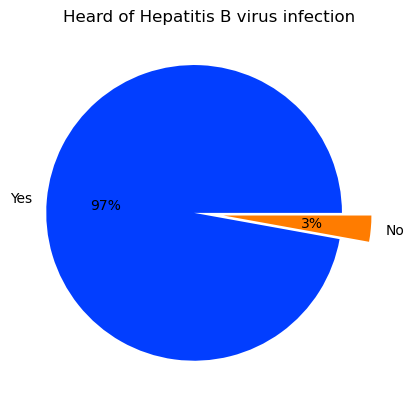

In [208]:
data = [97.156398, 2.843602]
keys = ['Yes', 'No']
  
# declaring exploding pie
explode = [0.1, 0.1]
# define Seaborn color palette to use
palette_color = sbn.color_palette('bright')
  
# plotting data on chart
plt.pie(data, labels=keys, colors=palette_color,
        explode=explode, autopct='%.0f%%')
plt.title('Heard of Hepatitis B virus infection')
  
# displaying chart
plt.show()

In [209]:
#KNOWLEDGE ON HEPATITIS B VIRUS INFECTION ADDITION
df['KnowHepBInf']=df[' Hepatitis B cannot be spread through sharp objects such as needles and operation tools']+df[' Hepatitis B can be spread through sharing of tooth brush']+df[' Hepatitis B cannot be transferred from mother to foetus'] +df[' Sexual transmission is the only way Hepatitis B can spread']+df[' Hepatitis B can be acquired through sharing of towel']+df[' Hepatitis B can be acquired via the use of unsterile tattoo equipment'] +df[' Hepatitis B can be acquired through sitting on water closet or splashes of water from water closet'] +df[' Hepatitis B can be spread via blood transfusion'] +df[' Hepatitis B can be spread within a family via close contact with intact/uncompromised skin']+df[" Hepatis B can be transferred through mother's milk to the infant"] +df[' Hepatitis B can lead to liver cirrhosis']+df[' Hepatitis B is associated with an increased risk of liver cancer'] +df[' A person infected with Hepatitis B will always manifest symptoms of the disease']+df[' Hepatitis B screening should only be done before marriage']+df[' There can be co-infection of Hepatitis B and C in one person'] 


#KNOWLEDGE OF HEPATITIS B SCREENING, VACCINATION AND POST-VACCINATION SEROLOGICAL TEST ADDITION

df['KnowHepBScreen']=df[' There is vaccine against Hepatitis B virus'] +df[' Hepatitis B vaccination can cause Hepatitis B infection'] +df[' Hepatitis B vaccine can prevent Hepatitis B infection'] +df[' For complete vaccination 2 doses of the vaccine are given'] +df[' Asymptomatic family members living with an Hepatitis B infected person do not need screening'] + df[' People living with HIV should be screened for Hepatitis B virus'] +df[' There is no post-vaccination serology test for hepatitis B virus'] +df[' Post-vaccination serology test is done 1 to 2 months after receiving the 2nd dose of the vaccine'] +  df[' An anti-HBs serlogical test result of <10mIU/ml after vaccination confers immunity'] 


/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)


Text(0.5, 1.0, 'Source of Awareness of Hepatitis B virus infection')

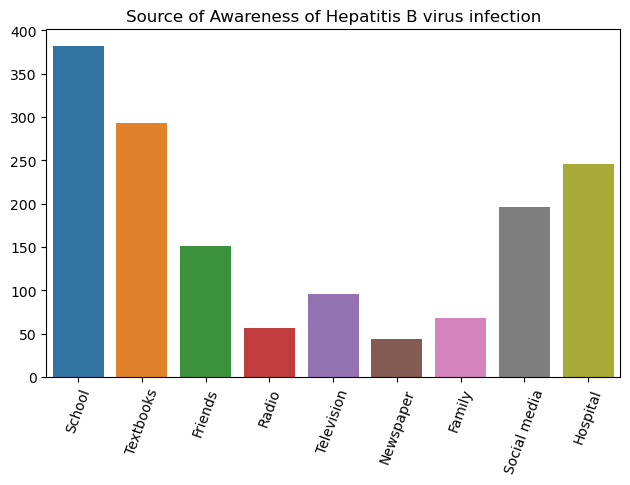

In [210]:
#SOURCE OF AWARENESS OF HEPATITIS B VIRUS INFECTION USING A BAR CHART

x_axis = ['School', 'Textbooks', 'Friends', 'Radio', 'Television', 'Newspaper', 'Family', 'Social media', 'Hospital']
y_axis = [382, 293, 151, 56, 96, 44, 68, 196, 246]


sbn.barplot(data=df, x=x_axis, y=y_axis,)
plt.xticks(rotation=70)
plt.tight_layout()
plt.title('Source of Awareness of Hepatitis B virus infection')

In [211]:
#Frequency People scoring >=10
Know10AboveFre=df['KnowHepBInf'][df['KnowHepBInf']>=10].count()
Know10AboveFre

384

In [212]:
#Proportion of People scoring >=10
Know10AboveProp=(df['KnowHepBInf'][df['KnowHepBInf']>=10].count()/df['KnowHepBInf'].count())*100
Know10AboveProp


93.65853658536587

In [213]:
#ADDING TWO NEW COLUMNS FOR GOOD AND POOR KNOWLEDGE

df['Know10Above']=df['KnowHepBInf'][df['KnowHepBInf']>=10]
df['Know9Below']=df['KnowHepBInf'][df['KnowHepBInf']<=9]

In [214]:
df['Know10Above'].count()

384

In [215]:
#FREQUENCY OF GOOD KNOWLEDGE ACROSS LessAge
GoodKnowFreqLessAge= pd.crosstab(index=df['Age (in years)'] <= 24, columns=df['Know10Above'], margins=True)

#FREQUENCY OF POOR KNOWLEDGE ACROSS LessAge
PoorKnowFreqLessAge= pd.crosstab(index=df['Age (in years)'] <= 24, columns=df['Know9Below'], margins=True)


In [216]:
GoodKnowFreqLessAge

Know10Above,10.0,11.0,12.0,13.0,14.0,15.0,All
Age (in years),,,,,,,
False,6,14,18,26,11,6,81
True,28,40,60,79,76,20,303
All,34,54,78,105,87,26,384


In [217]:
PoorKnowFreqLessAge

Know9Below,4.0,5.0,6.0,7.0,8.0,9.0,All
Age (in years),,,,,,,
True,1,1,2,2,7,13,26
All,1,1,2,2,7,13,26


In [218]:
#FREQUENCY OF GOOD KNOWLEDGE ACROSS MoreAge
GoodKnowFreqMoreAge= pd.crosstab(index=df['Age (in years)'] > 24, columns=df['Know10Above'], margins=True)

#FREQUENCY OF POOR KNOWLEDGE ACROSS MoreAge
PoorKnowFreqMoreAge= pd.crosstab(index=df['Age (in years)'] > 24, columns=df['Know9Below'], margins=True)


In [219]:
GoodKnowFreqMoreAge

Know10Above,10.0,11.0,12.0,13.0,14.0,15.0,All
Age (in years),,,,,,,
False,28,40,60,79,76,20,303
True,6,14,18,26,11,6,81
All,34,54,78,105,87,26,384


In [220]:
PoorKnowFreqMoreAge

Know9Below,4.0,5.0,6.0,7.0,8.0,9.0,All
Age (in years),,,,,,,
False,1,1,2,2,7,13,26
All,1,1,2,2,7,13,26


In [221]:
#FREQUENCY OF GOOD KNOWLEDGE ACROSS Gender
GoodKnowFreqGender= pd.crosstab(index=df['Sex'], columns=df['Know10Above'], margins=True)

#FREQUENCY OF POOR KNOWLEDGE ACROSS Gender
PoorKnowFreqGender= pd.crosstab(index=df['Sex'], columns=df['Know9Below'], margins=True)


In [222]:
GoodKnowFreqGender

Know10Above,10.0,11.0,12.0,13.0,14.0,15.0,All
Sex,,,,,,,
Female,17,35,41,49,50,10,202
Male,17,19,37,56,37,16,182
All,34,54,78,105,87,26,384


In [223]:
PoorKnowFreqGender

Know9Below,4.0,5.0,6.0,7.0,8.0,9.0,All
Sex,,,,,,,
Female,1,0,1,0,4,10,16
Male,0,1,1,2,3,3,10
All,1,1,2,2,7,13,26


In [224]:
#FREQUENCY OF GOOD KNOWLEDGE ACROSS Department
GoodKnowFreqDep= pd.crosstab(index=df['Department'], columns=df['Know10Above'], margins=True)

#FREQUENCY OF POOR KNOWLEDGE ACROSS DEPARTMENTS
PoorKnowFreqDep= pd.crosstab(index=df['Department'], columns=df['Know9Below'], margins=True)


In [225]:
GoodKnowFreqDep

Know10Above,10.0,11.0,12.0,13.0,14.0,15.0,All
Department,,,,,,,
Biomedical Laboratory Sciences,1,7,5,8,4,1,26
Dentistry,6,9,7,15,10,4,51
Medicine and Surgery,17,22,46,66,59,20,230
Nursing,6,10,10,8,7,1,42
Physiotherapy,4,6,10,8,7,0,35
All,34,54,78,105,87,26,384


In [226]:
PoorKnowFreqDep

Know9Below,4.0,5.0,6.0,7.0,8.0,9.0,All
Department,,,,,,,
Biomedical Laboratory Sciences,1,0,0,0,0,1,2
Dentistry,0,0,0,1,1,0,2
Medicine and Surgery,0,1,1,0,3,3,8
Nursing,0,0,0,0,2,5,7
Physiotherapy,0,0,1,1,1,4,7
All,1,1,2,2,7,13,26


In [227]:
#FREQUENCY OF GOOD KNOWLEDGE ACROSS Levels
GoodKnowFreqLev= pd.crosstab(index=df['Year of study(Year as at the middle of 2021)'], columns=df['Know10Above'], margins=True)

#FREQUENCY OF POOR KNOWLEDGE ACROSS LEVELS
PoorKnowFreqLev= pd.crosstab(index=df['Year of study(Year as at the middle of 2021)'], columns=df['Know9Below'], margins=True)



In [228]:
GoodKnowFreqLev

Know10Above,10.0,11.0,12.0,13.0,14.0,15.0,All
Year of study(Year as at the middle of 2021),,,,,,,
200 level,7,8,11,13,7,1,47
300 level,5,9,10,18,16,4,62
400 level,8,12,15,21,20,3,79
500 level,12,15,23,30,31,6,117
600 level,2,10,19,23,13,12,79
All,34,54,78,105,87,26,384


In [229]:
PoorKnowFreqLev

Know9Below,4.0,5.0,6.0,7.0,8.0,9.0,All
Year of study(Year as at the middle of 2021),,,,,,,
200 level,0,1,0,1,2,4,8
300 level,0,0,1,0,1,2,4
400 level,1,0,1,1,0,5,8
500 level,0,0,0,0,4,1,5
600 level,0,0,0,0,0,1,1
All,1,1,2,2,7,13,26


In [230]:
#FREQUENCY OF GOOD KNOWLEDGE ACROSS Religion
GoodKnowFreqRel= pd.crosstab(index=df['Religion'], columns=df['Know10Above'], margins=True)

#FREQUENCY OF POOR KNOWLEDGE ACROSS DEPARTMENTS
PoorKnowFreqRel= pd.crosstab(index=df['Religion'], columns=df['Know9Below'], margins=True)


In [231]:
GoodKnowFreqRel

Know10Above,10.0,11.0,12.0,13.0,14.0,15.0,All
Religion,,,,,,,
Christianity,31,47,71,94,73,19,335
Islam,3,7,7,10,13,4,44
others,0,0,0,1,1,3,5
All,34,54,78,105,87,26,384


In [232]:
PoorKnowFreqRel

Know9Below,4.0,5.0,6.0,7.0,8.0,9.0,All
Religion,,,,,,,
Christianity,1,1,2,2,7,13,26
All,1,1,2,2,7,13,26


In [233]:
#FREQUENCY OF GOOD KNOWLEDGE ACROSS GPZ
GoodKnowFreqGPZ= pd.crosstab(index=df['Geo-political zone in Nigeria (place of origin)'], columns=df['Know10Above'], margins=True)

#FREQUENCY OF POOR KNOWLEDGE ACROSS DEPARTMENTS
PoorKnowFreqGPZ= pd.crosstab(index=df['Geo-political zone in Nigeria (place of origin)'], columns=df['Know9Below'], margins=True)


In [234]:
GoodKnowFreqGPZ

Know10Above,10.0,11.0,12.0,13.0,14.0,15.0,All
Geo-political zone in Nigeria (place of origin),,,,,,,
North Central,3,3,3,5,5,2,21
North East,0,1,1,2,0,0,4
North West,0,0,2,0,3,0,5
South East,2,8,6,16,9,2,43
South South,2,4,10,3,2,1,22
South West,27,38,56,79,68,21,289
All,34,54,78,105,87,26,384


In [235]:
PoorKnowFreqGPZ

Know9Below,4.0,5.0,6.0,7.0,8.0,9.0,All
Geo-political zone in Nigeria (place of origin),,,,,,,
North Central,0,0,1,0,0,0,1
North West,0,0,0,0,0,1,1
South East,1,0,0,1,1,3,6
South South,0,0,0,0,1,0,1
South West,0,1,1,1,5,9,17
All,1,1,2,2,7,13,26


In [236]:
#Chi Square test to check for significance of level of knowledge with Age
ChiDepKnowAge=np.array([[26, 303], [0, 81]])

#Chi Square test to check for significance of level of knowledge with Gender
ChiDepKnowSex=np.array([[10, 182], [16, 202]])

#Chi Square test to check for significance of level of knowledge with department
ChiDepKnowDep=np.array([[2, 26], [2, 51], [8, 230], [7, 42], [7, 35]])


#Chi Square test to check for significance of level of knowledge with Level of study
ChiLevKnowLev=np.array([[8, 47], [4, 62], [8, 79], [5, 117], [1, 79]])

#Chi Square test to check for significance of level of knowledge with Religion
ChiDepKnowRel=np.array([[26, 335], [0, 44], [0, 5]])


#Chi Square test to check for significance of level of knowledge with GPZ
ChiLevKnowGPZ=np.array([[17, 289], [6, 43], [1, 22], [1, 21], [0, 4], [1, 5]])

In [237]:
stats.fisher_exact(ChiDepKnowAge)

SignificanceResult(statistic=inf, pvalue=0.004124196176158702)

In [238]:
stats.chi2_contingency(ChiDepKnowSex)

Chi2ContingencyResult(statistic=0.4630576209779689, pvalue=0.49619844626462306, dof=1, expected_freq=array([[ 12.17560976, 179.82439024],
       [ 13.82439024, 204.17560976]]))

In [239]:
stats.chi2_contingency(ChiDepKnowDep)

Chi2ContingencyResult(statistic=16.923187718181126, pvalue=0.0020005102495799913, dof=4, expected_freq=array([[  1.77560976,  26.22439024],
       [  3.36097561,  49.63902439],
       [ 15.09268293, 222.90731707],
       [  3.10731707,  45.89268293],
       [  2.66341463,  39.33658537]]))

In [240]:
stats.chi2_contingency(ChiLevKnowLev)

Chi2ContingencyResult(statistic=11.959788592268211, pvalue=0.017652806084275306, dof=4, expected_freq=array([[  3.48780488,  51.51219512],
       [  4.18536585,  61.81463415],
       [  5.51707317,  81.48292683],
       [  7.73658537, 114.26341463],
       [  5.07317073,  74.92682927]]))

In [241]:
stats.chi2_contingency(ChiDepKnowRel)

Chi2ContingencyResult(statistic=3.768034395198522, pvalue=0.15197835074345395, dof=2, expected_freq=array([[2.28926829e+01, 3.38107317e+02],
       [2.79024390e+00, 4.12097561e+01],
       [3.17073171e-01, 4.68292683e+00]]))

In [242]:
stats.chi2_contingency(ChiLevKnowGPZ)

Chi2ContingencyResult(statistic=4.814645766945843, pvalue=0.4389174770807084, dof=5, expected_freq=array([[1.94048780e+01, 2.86595122e+02],
       [3.10731707e+00, 4.58926829e+01],
       [1.45853659e+00, 2.15414634e+01],
       [1.39512195e+00, 2.06048780e+01],
       [2.53658537e-01, 3.74634146e+00],
       [3.80487805e-01, 5.61951220e+00]]))

In [243]:
#Function To Get Proportion of Good Knowledge across departments and level

def prop(a,b,c,d,e,A,B,C,D,E):
    aa=(a/A)*100
    bb=(b/B)*100
    cc=(c/C)*100
    dd=(d/D)*100
    ee=(e/E)*100
    print(aa, bb, cc, dd, ee)
    

In [244]:
prop(47,62,79,117,79,55,66,87,122,80 )

85.45454545454545 93.93939393939394 90.80459770114942 95.90163934426229 98.75


In [245]:
#Proportion of Correct response for each question of Hep B Virus Infection
A=pd.crosstab(index=df[' Hepatitis B cannot be spread through sharp objects such as needles and operation tools'], 
            columns='options')
B=pd.crosstab(index=df[' Hepatitis B can be spread through sharing of tooth brush'], 
            columns='options')
C=pd.crosstab(index=df[' Hepatitis B cannot be transferred from mother to foetus'], 
            columns='options')
D=pd.crosstab(index=df[' Sexual transmission is the only way Hepatitis B can spread'], 
            columns='options')
E=pd.crosstab(index=df[' Hepatitis B can be acquired through sharing of towel'], 
            columns='options')
F=pd.crosstab(index=df[' Hepatitis B can be acquired via the use of unsterile tattoo equipment'], 
            columns='options')
G=pd.crosstab(index=df[' Hepatitis B can be acquired through sitting on water closet or splashes of water from water closet'], 
            columns='options')
H=pd.crosstab(index=df[' Hepatitis B can be spread via blood transfusion'], 
            columns='options')
I=pd.crosstab(index=df[' Hepatitis B can be spread within a family via close contact with intact/uncompromised skin'], 
            columns='options')
J=pd.crosstab(index=df[" Hepatis B can be transferred through mother's milk to the infant"], 
            columns='options')
K=pd.crosstab(index=df[' Hepatitis B can lead to liver cirrhosis'], 
            columns='options')
L=pd.crosstab(index=df[' Hepatitis B is associated with an increased risk of liver cancer'], 
            columns='options')
M=pd.crosstab(index=df[' A person infected with Hepatitis B will always manifest symptoms of the disease'], 
            columns='options')
N=pd.crosstab(index=df[' Hepatitis B screening should only be done before marriage'], 
            columns='options')
O=pd.crosstab(index=df[' There can be co-infection of Hepatitis B and C in one person'], 
            columns='options')

#Percentage of correct answers
def CorPer(a):
    per=(a/410)*100
    return print(per)


In [246]:
CorPer(325)

79.26829268292683


In [247]:
#Attitude of respondents towards Hepatitis B virus Infection

P=pd.crosstab(index=[' I try not to spend much time when I give services to Hepatitis B positive patients'], 
            columns=df[' I try not to spend much time when I give services to Hepatitis B positive patients'])
P.columns=['Strongly Agree','Disagree',"Don't Know",'Agree','Strongly Agree']

Q=pd.crosstab(index=[' Health care professionals who are Hepatitis B positive should not give health care services to patients'], 
            columns=df[' Health care professionals who are Hepatitis B positive should not give health care services to patients'])
Q.columns=['Strongly Agree','Disagree',"Don't Know",'Agree','Strongly Agree']

R=pd.crosstab(index=[' I would prefer to wear two pair of gloves when treating a bleeding person with Hepatitis B'], 
            columns=df[' I would prefer to wear two pair of gloves when treating a bleeding person with Hepatitis B'])
R.columns=['Strongly Agree','Disagree',"Don't Know",'Agree','Strongly Agree']

S=pd.crosstab(index=[' I think Hepatitis B testing should be done before marriage'], 
            columns=df[' I think Hepatitis B testing should be done before marriage'])
S.columns=['Strongly Agree','Disagree',"Don't Know",'Agree','Strongly Agree']

T=pd.crosstab(index=[' People with Hepatitis B infection should be restricted from working in the food industry'], 
            columns=df[' People with Hepatitis B infection should be restricted from working in the food industry'])
T.columns=['Strongly Agree','Disagree',"Don't Know",'Agree','Strongly Agree']

U=pd.crosstab(index=[' Following infection control guidelines will not protect me from being infected with Hepatitis B'], 
            columns=df[' Following infection control guidelines will not protect me from being infected with Hepatitis B'])
U.columns=['Strongly Agree','Disagree',"Don't Know",'Agree','Strongly Agree']

V=pd.crosstab(index=[' Do you think it is necessary to incorporate a Hepatitis B vaccination policy into the training curriculum of health care students'], 
            columns=df[' Do you think it is necessary to incorporate a Hepatitis B vaccination policy into the training curriculum of health care students'])
V.columns=['Strongly Agree','Disagree',"Don't Know",'Agree','Strongly Agree']




KeyError: ' I try not to spend much time when I give services to Hepatitis B positive patients'

In [ ]:
#ADDING TWO NEW COLUMNS FOR GOOD AND POOR KNOWLEDGE ON SCREENING

df['KnowS6Above']=df['KnowHepBScreen'][df['KnowHepBScreen']>=6]
df['KnowS5Below']=df['KnowHepBScreen'][df['KnowHepBScreen']<=5]


In [248]:
#Number of People scoring >=6
df['KnowS6Above'].count()


KeyError: 'KnowS6Above'

In [ ]:
#Proportion of People scoring >=6
(df['KnowS6Above'].count()/df['KnowHepBScreen'].count())*100

In [249]:

#FREQUENCY OF SCREENING GOOD KNOWLEDGE ACROSS LesAge
GoodKnowSFreqLesAge= pd.crosstab(index=df['Age (in years)'] <= 24, columns=df['KnowS6Above'], margins=True)
#FREQUENCY OF SCREENING POOR KNOWLEDGE ACROSS LesAge
PoorKnowSFreqLesAge= pd.crosstab(index=df['Age (in years)'] <= 24, columns=df['KnowS5Below'], margins=True)


#FREQUENCY OF SCREENING GOOD KNOWLEDGE ACROSS MorAge
GoodKnowSFreqMorAge= pd.crosstab(index=df['Age (in years)'] > 24, columns=df['KnowS6Above'], margins=True)
#FREQUENCY OF SCREENING POOR KNOWLEDGE ACROSS DEPARTMENTS
PoorKnowSFreqMorAge= pd.crosstab(index=df['Age (in years)'] > 24, columns=df['KnowS5Below'], margins=True)

#FREQUENCY OF SCREENING GOOD KNOWLEDGE ACROSS Gender
GoodKnowSFreqGend= pd.crosstab(index=df['Sex'], columns=df['KnowS6Above'], margins=True)
#FREQUENCY OF SCREENING POOR KNOWLEDGE ACROSS Gender
PoorKnowSFreqGend= pd.crosstab(index=df['Sex'], columns=df['KnowS5Below'], margins=True)

#FREQUENCY OF SCREENING GOOD KNOWLEDGE ACROSS Departemnt
GoodKnowSFreqDepart= pd.crosstab(index=df['Department'], columns=df['KnowS6Above'], margins=True)
#FREQUENCY OF SCREENING POOR KNOWLEDGE ACROSS Department
PoorKnowSFreqDepart= pd.crosstab(index=df['Department'], columns=df['KnowS5Below'], margins=True)

#FREQUENCY OF SCREENING GOOD KNOWLEDGE ACROSS Levels
GoodKnowSFreqL= pd.crosstab(index=df['Year of study(Year as at the middle of 2021)'], columns=df['KnowS6Above'], margins=True)
#FREQUENCY OF SCREENING POOR KNOWLEDGE ACROSS LEVELS
PoorKnowSFreqL= pd.crosstab(index=df['Year of study(Year as at the middle of 2021)'], columns=df['KnowS5Below'], margins=True)

#FREQUENCY OF SCREENING GOOD KNOWLEDGE ACROSS Religion
GoodKnowSFreqRel= pd.crosstab(index=df['Religion'], columns=df['KnowS6Above'], margins=True)
#FREQUENCY OF SCREENING POOR KNOWLEDGE ACROSS DEPARTMENTS
PoorKnowSFreqRel= pd.crosstab(index=df['Religion'], columns=df['KnowS5Below'], margins=True)

#FREQUENCY OF SCREENING GOOD KNOWLEDGE ACROSS GPZ
GoodKnowSFreqGPZ= pd.crosstab(index=df['Geo-political zone in Nigeria (place of origin)'], columns=df['KnowS6Above'], margins=True)
#FREQUENCY OF SCREENING POOR KNOWLEDGE ACROSS DEPARTMENTS
PoorKnowSFreqGPZ= pd.crosstab(index=df['Geo-political zone in Nigeria (place of origin)'], columns=df['KnowS5Below'], margins=True)

KeyError: 'KnowS6Above'

In [ ]:
GoodKnowSFreqLesAge

In [ ]:
PoorKnowSFreqLesAge

In [250]:
GoodKnowSFreqMorAge

NameError: name 'GoodKnowSFreqMorAge' is not defined

In [ ]:
PoorKnowSFreqMorAge

In [251]:
GoodKnowSFreqGend

NameError: name 'GoodKnowSFreqGend' is not defined

In [ ]:
PoorKnowSFreqGend

In [ ]:
GoodKnowSFreqDepart

In [252]:
PoorKnowSFreqDepart

NameError: name 'PoorKnowSFreqDepart' is not defined

In [ ]:
GoodKnowSFreqL

In [253]:
PoorKnowSFreqL

NameError: name 'PoorKnowSFreqL' is not defined

In [ ]:
GoodKnowSFreqRel

In [254]:
PoorKnowSFreqRel

NameError: name 'PoorKnowSFreqRel' is not defined

In [ ]:
GoodKnowSFreqGPZ

In [255]:
PoorKnowSFreqGPZ

NameError: name 'PoorKnowSFreqGPZ' is not defined

In [ ]:
prop(45,56,79,106,78,55,66,87,122,80)

In [256]:
#Chi Square test to check for significance of level of Screening knowledge with Age
ChiSKnowAgee=np.array([[39, 290], [7, 74]])


#Chi Square test to check for significance of level of Screening knowledge with Gender
ChiSKnowGender=np.array([[21, 171], [25, 193]])

#Chi Square test to check for significance of level of Screening knowledge with department
ChiSKnowDep=np.array([[2, 26], [6, 47], [21, 217], [9, 40], [8, 34]])


#Chi Square test to check for significance of level of Screening knowledge with Level of study
ChiSKnowLev=np.array([[10, 45], [10, 56], [8, 79], [16, 106], [2, 78]])

#Chi Square test to check for significance of level of Screening knowledge with Religion
ChiSKnowRelig=np.array([[41, 320], [5, 39], [0, 5]])


#Chi Square test to check for significance of level of Screening knowledge with GPZ
ChiSKnowGPZ=np.array([[36, 270], [7, 42], [0, 23], [3, 19], [0, 4], [0, 6]])


In [257]:
stats.chi2_contingency(ChiSKnowAgee)

Chi2ContingencyResult(statistic=0.3894087462542596, pvalue=0.5326103535917652, dof=1, expected_freq=array([[ 36.91219512, 292.08780488],
       [  9.08780488,  71.91219512]]))

In [258]:
stats.chi2_contingency(ChiSKnowGender)

Chi2ContingencyResult(statistic=0.0001690693028385005, pvalue=0.9896256665022559, dof=1, expected_freq=array([[ 21.54146341, 170.45853659],
       [ 24.45853659, 193.54146341]]))

In [259]:
stats.chi2_contingency(ChiSKnowDep)

Chi2ContingencyResult(statistic=6.936622213543892, pvalue=0.1392755968045394, dof=4, expected_freq=array([[  3.14146341,  24.85853659],
       [  5.94634146,  47.05365854],
       [ 26.70243902, 211.29756098],
       [  5.49756098,  43.50243902],
       [  4.71219512,  37.28780488]]))

In [260]:
stats.chi2_contingency(ChiSKnowLev)

Chi2ContingencyResult(statistic=10.605143912911135, pvalue=0.03137907029860042, dof=4, expected_freq=array([[  6.17073171,  48.82926829],
       [  7.40487805,  58.59512195],
       [  9.76097561,  77.23902439],
       [ 13.68780488, 108.31219512],
       [  8.97560976,  71.02439024]]))

In [261]:
stats.chi2_contingency(ChiSKnowRelig)

Chi2ContingencyResult(statistic=0.6396705336094713, pvalue=0.7262686677781098, dof=2, expected_freq=array([[ 40.50243902, 320.49756098],
       [  4.93658537,  39.06341463],
       [  0.56097561,   4.43902439]]))

In [262]:
stats.chi2_contingency(ChiSKnowGPZ)

Chi2ContingencyResult(statistic=4.853148769389179, pvalue=0.4340639068200268, dof=5, expected_freq=array([[ 34.33170732, 271.66829268],
       [  5.49756098,  43.50243902],
       [  2.5804878 ,  20.4195122 ],
       [  2.46829268,  19.53170732],
       [  0.44878049,   3.55121951],
       [  0.67317073,   5.32682927]]))

In [263]:
#Proportion of Correct response for each question of Hep B Virus Screening, Vaccination and Post-Vaccination Serological Test
A1=pd.crosstab(index=df[' There is vaccine against Hepatitis B virus'], 
            columns='options')
B1=pd.crosstab(index=df[' Hepatitis B vaccination can cause Hepatitis B infection'], 
            columns='options')
C1=pd.crosstab(index=df[' Hepatitis B vaccine can prevent Hepatitis B infection'], 
            columns='options')
D1=pd.crosstab(index=df[' For complete vaccination 2 doses of the vaccine are given'], 
            columns='options')
E1=pd.crosstab(index=df[' Asymptomatic family members living with an Hepatitis B infected person do not need screening'], 
            columns='options')
F1=pd.crosstab(index=df[' People living with HIV should be screened for Hepatitis B virus'], 
            columns='options')
G1=pd.crosstab(index=df[' There is no post-vaccination serology test for hepatitis B virus'], 
            columns='options')
H1=pd.crosstab(index=df[' Post-vaccination serology test is done 1 to 2 months after receiving the 2nd dose of the vaccine'], 
            columns='options')
I1=pd.crosstab(index=df[' An anti-HBs serlogical test result of <10mIU/ml after vaccination confers immunity'], 
            columns='options')


In [264]:
CorPer(204)

49.75609756097561


In [265]:
#Attitude of respondents towards HEPATITIS B SCREENING, VACCINATION AND POST-VACCINATION SEROLOGICAL TEST

P1=pd.crosstab(index=[' Do you think that vaccination protects against Hepatitis B viral infection'], 
            columns=df[' Do you think that vaccination protects against Hepatitis B viral infection'])
P1.columns=['Strongly Disagree','Disagree',"Don't Know",'Agree','Strongly Agree']

Q1=pd.crosstab(index=[' I am concerned about the side effects of vaccination'], 
            columns=df[' I am concerned about the side effects of vaccination'])
Q1.columns=['Strongly Disagree','Disagree',"Don't Know",'Agree','Strongly Agree']

R1=pd.crosstab(index=[' Do you think there is need to know your Hepatitis B status'], 
            columns=df[' Do you think there is need to know your Hepatitis B status'])
R1.columns=['Strongly Disagree','Disagree',"Don't Know",'Agree','Strongly Agree']

S1=pd.crosstab(index=[' Do you consider it a necessity to be vaccinated against Hepatitis B '], 
            columns=df[' Do you consider it a necessity to be vaccinated against Hepatitis B '])
S1.columns=['Strongly Disagree','Disagree',"Don't Know",'Agree','Strongly Agree']


T1=pd.crosstab(index=[' Do you think there is a need to do a post-vaccine serology test after vaccination'], 
            columns=df[' Do you think there is a need to do a post-vaccine serology test after vaccination'])
T1.columns=['Strongly Disagree','Disagree',"Don't Know",'Agree','Strongly Agree']



KeyError: ' Do you think that vaccination protects against Hepatitis B viral infection'

In [266]:
#Response to if they had done Hep B virus Screening

pd.crosstab(index=df['Have you ever been screened for Hepatitis B virus?'], columns='count', margins=True)

col_0,count,All
Have you ever been screened for Hepatitis B virus?,,
No,137,137
Yes,273,273
All,410,410


In [267]:
#Response to screening across Sociodographic variables
#Less.Age
ResSreenLesAgek=pd.crosstab(index=df['Age (in years)'] <= 24, columns=df['Have you ever been screened for Hepatitis B virus?'], margins=True)
ResSreenLesAgek.columns=['No', 'Yes', 'col_total']

#More.Age
ResSreenMoreAgek=pd.crosstab(index=df['Age (in years)'] > 24, columns=df['Have you ever been screened for Hepatitis B virus?'], margins=True)
ResSreenMoreAgek.columns=['No', 'Yes', 'col_total']

#Gen.der
ResSreenGenderk=pd.crosstab(index=df['Sex'], columns=df['Have you ever been screened for Hepatitis B virus?'], margins=True)
ResSreenGenderk.columns=['No', 'Yes', 'col_total']

#Depart.ment
ResSreenDepk=pd.crosstab(index=df['Department'], columns=df['Have you ever been screened for Hepatitis B virus?'], margins=True)
ResSreenDepk.columns=['No', 'Yes', 'col_total']

#Lev.el
ResSreenLevk=pd.crosstab(index=df['Year of study(Year as at the middle of 2021)'], columns=df['Have you ever been screened for Hepatitis B virus?'], margins=True)
ResSreenLevk.columns=['No', 'Yes', 'col_total']

#Reli.gion
ResSreenRelk=pd.crosstab(index=df['Religion'], columns=df['Have you ever been screened for Hepatitis B virus?'], margins=True)
ResSreenRelk.columns=['No', 'Yes', 'col_total']

#GP.Z
ResSreenGPZ=pd.crosstab(index=df['Geo-political zone in Nigeria (place of origin)'], columns=df['Have you ever been screened for Hepatitis B virus?'], margins=True)
ResSreenGPZ.columns=['No', 'Yes', 'col_total']

In [268]:
ResSreenLesAgek

,No,Yes,col_total
Age (in years),,,
False,26,55,81
True,111,218,329
All,137,273,410


In [269]:
ResSreenMoreAgek

,No,Yes,col_total
Age (in years),,,
False,111,218,329
True,26,55,81
All,137,273,410


In [270]:
ResSreenGenderk

,No,Yes,col_total
Sex,,,
Female,67,151,218
Male,70,122,192
All,137,273,410


In [271]:
ResSreenDepk

,No,Yes,col_total
Department,,,
Biomedical Laboratory Sciences,5,23,28
Dentistry,16,37,53
Medicine and Surgery,69,169,238
Nursing,22,27,49
Physiotherapy,25,17,42
All,137,273,410


In [272]:
ResSreenLevk

,No,Yes,col_total
Year of study(Year as at the middle of 2021),,,
200 level,39,16,55
300 level,28,38,66
400 level,30,57,87
500 level,30,92,122
600 level,10,70,80
All,137,273,410


In [273]:
ResSreenRelk

,No,Yes,col_total
Religion,,,
Christianity,123,238,361
Islam,12,32,44
others,2,3,5
All,137,273,410


In [274]:
ResSreenGPZ

,No,Yes,col_total
Geo-political zone in Nigeria (place of origin),,,
North Central,7,15,22
North East,1,3,4
North West,2,4,6
South East,14,35,49
South South,10,13,23
South West,103,203,306
All,137,273,410


In [275]:
#Chi Square test to check for significance of Screened? with Age
ChiAgeScreened=np.array([[111, 218], [26, 81]])

#Chi Square test to check for significance of Screened? with Gender
ChiGenderScreened=np.array([[70, 112], [67, 151]])

#Chi Square test to check for significance of Screened? with department
ChiDepScreened=np.array([[5, 23], [16, 37], [69, 169], [22, 27], [25, 17]])

#Chi Square test to check for significance of Screened with Level of study
ChiLevScreened=np.array([[39, 16], [28, 38], [30, 57], [30, 92], [10, 70]])

#Chi Square test to check for significance of Screened? with Religion
ChiReligionScreened=np.array([[123, 238], [12, 32], [2, 3]])

#Chi Square test to check for significance of Screened? with GPZ
ChiGPZScreened=np.array([[103, 203], [14, 35], [10, 13], [7, 15], [1, 3], [2, 4]])


In [276]:
stats.chi2_contingency(ChiAgeScreened)

Chi2ContingencyResult(statistic=2.914998040641568, pvalue=0.0877595192737625, dof=1, expected_freq=array([[103.37844037, 225.62155963],
       [ 33.62155963,  73.37844037]]))

In [277]:
stats.chi2_contingency(ChiGenderScreened)

Chi2ContingencyResult(statistic=2.298307668988727, pvalue=0.12951504344270431, dof=1, expected_freq=array([[ 62.335, 119.665],
       [ 74.665, 143.335]]))

In [278]:
stats.chi2_contingency(ChiDepScreened)

Chi2ContingencyResult(statistic=21.158918932251375, pvalue=0.00029450143762730063, dof=4, expected_freq=array([[  9.35609756,  18.64390244],
       [ 17.7097561 ,  35.2902439 ],
       [ 79.52682927, 158.47317073],
       [ 16.37317073,  32.62682927],
       [ 14.03414634,  27.96585366]]))

In [279]:
stats.chi2_contingency(ChiLevScreened)

Chi2ContingencyResult(statistic=57.20263676874488, pvalue=1.1218022445228868e-11, dof=4, expected_freq=array([[18.37804878, 36.62195122],
       [22.05365854, 43.94634146],
       [29.07073171, 57.92926829],
       [40.76585366, 81.23414634],
       [26.73170732, 53.26829268]]))

In [280]:
stats.chi2_contingency(ChiReligionScreened)

Chi2ContingencyResult(statistic=0.9135844643457322, pvalue=0.6333119082335419, dof=2, expected_freq=array([[120.62682927, 240.37317073],
       [ 14.70243902,  29.29756098],
       [  1.67073171,   3.32926829]]))

In [281]:
stats.chi2_contingency(ChiGPZScreened)

Chi2ContingencyResult(statistic=1.7243333175716924, pvalue=0.8858200272786722, dof=5, expected_freq=array([[102.24878049, 203.75121951],
       [ 16.37317073,  32.62682927],
       [  7.68536585,  15.31463415],
       [  7.35121951,  14.64878049],
       [  1.33658537,   2.66341463],
       [  2.00487805,   3.99512195]]))

In [282]:
#pd.crosstab(index=df[' Have you ever been screened for Hepatitis C virus? '], columns='count', margins=True)

In [283]:
#pd.crosstab(index=df['What is your Hepatitis C virus infection status?'], columns='count', margins=True)

In [284]:
#pd.crosstab(index=df['Have you ever had any previous history of needle stick Injury?'], columns='count', margins=True)

In [285]:
#pd.crosstab(index=df['If yes, did you seek for a post-exposure prophylaxis against hepatitis B virus following the Injury?'], columns='count', margins=True)

In [286]:
#pd.crosstab(index=df['If no, why did you not seek for post-exposure prophylaxis against hepatitis B virus following the injury?'], columns='count', margins=True)

In [287]:
#Reasons for being screened
pd.crosstab(index=df['Why did you go for the screening?'], columns='count', margins=True)

col_0,count,All
Why did you go for the screening?,,
An opportunity to do it came up,1,1
Association,1,1
At an outreach,1,1
Before taking the vaccine,1,1
Before vaccination,1,1
Before vaccination,2,2
Department association organised a vaccination program for us,1,1
Did it as a child,1,1
For blood donation,1,1


In [288]:
pd.crosstab(index=df['What is your Hepatitis B virus Infection status?'], columns='count', margins=True)

col_0,count,All
What is your Hepatitis B virus Infection status?,,
I can't remember,3,3
Negative,267,267
Positive,3,3
All,273,273


In [289]:
pd.crosstab(index=df['Have you ever received the hepatitis B vaccine before?'], columns='count', margins=True)

col_0,count,All
Have you ever received the hepatitis B vaccine before?,,
No,25,25
Yes,248,248
All,273,273


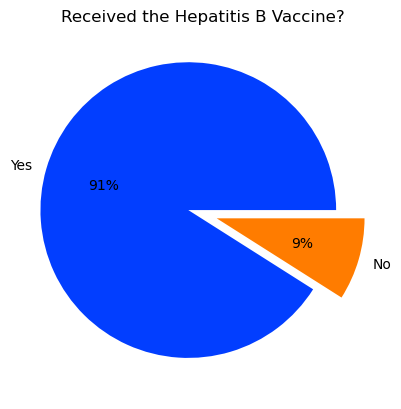

In [290]:
data = [91, 9]
keys = ['Yes', 'No']
  
# declaring exploding pie
explode = [0.1, 0.1]
# define Seaborn color palette to use
palette_color = sbn.color_palette('bright')
  
# plotting data on chart
plt.pie(data, labels=keys, colors=palette_color,
        explode=explode, autopct='%.0f%%')
plt.title('Received the Hepatitis B Vaccine?')
  
# displaying chart
plt.show()

In [291]:
pd.crosstab(index=df['Do you have any reason for not taking the vaccine ?'], columns='count', margins=True)

col_0,count,All
Do you have any reason for not taking the vaccine ?,,
I don't have enough time,3,3
I don't have sufficient funds,5,5
I don't have sufficient funds;Due to fear of needles/injections;Fear of side effects or adverse effects of the vaccine;There is poor availability of the vaccine,1,1
I don't have sufficient funds;I don't have enough time;I'm unwilling to be vaccinated,1,1
I don't have sufficient funds;I don't have enough time;There is poor availability of the vaccine,1,1
I don't have sufficient funds;I tested positive for hepatitis B screening;No reason at all,1,1
I don't have sufficient funds;I'm unwilling to be vaccinated;Due to fear of needles/injections,1,1
I'm unwilling to be vaccinated,1,1
No reason at all,11,11


In [292]:
pd.crosstab(index=df['How many doses have you received'], columns='count', margins=True)

col_0,count,All
How many doses have you received,,
03-Apr,1,1
1,27,27
2,96,96
3,120,120
4,1,1
Cannot remember,1,1
"Don't know, it was at birth",1,1
I’m not sure,1,1
All,248,248


In [293]:
pd.crosstab(index=df['Why have you not completed the dose?'], columns=df['How many doses have you received'], margins=True)

How many doses have you received,1,2,All
Why have you not completed the dose?,,,
Completed o I said I've completed it,0,1,1
Dose completed,0,1,1
I believe the dose(s) I have taken already is/are enough,1,11,12
I do not care,1,1,2
I do not have money,6,2,8
I forgot to collect the next dose,15,19,34
I have,0,1,1
I have completed my dose,0,1,1
I have completed it,0,3,3


In [294]:
pd.crosstab(index=df['Did you return for the post-vaccination serology test?'], columns='option', margins=True)

col_0,option,All
Did you return for the post-vaccination serology test?,,
No,118,118
Yes,7,7
All,125,125


In [295]:
pd.crosstab(index=df['Did you return for the post-vaccination serology test?'], columns=[df['How many doses have you received'], df['Year of study(Year as at the middle of 2021)']], margins=True)

How many doses have you received                      03-Apr         3  \
Year of study(Year as at the middle of 2021)       600 level 300 level   
Did you return for the post-vaccination serolog...                       
No                                                         1        15   
Yes                                                        0         0   
All                                                        1        15   

How many doses have you received                                        \
Year of study(Year as at the middle of 2021)       400 level 500 level   
Did you return for the post-vaccination serolog...                       
No                                                        27        41   
Yes                                                        1         5   
All                                                       28        46   

How many doses have you received                                     4  \
Year of study(Year as at the middle of 2021)       600 level 400 level   
Did you return for the post-vaccination serolog...                       
No                                                        30         1   
Yes                                                        1         0   
All                                                       31         1   

How many doses have you received                   Cannot remember  \
Year of study(Year as at the middle of 2021)             300 level   
Did you return for the post-vaccination serolog...                   
No                                                               1   
Yes                                                              0   
All                                                              1   

How many doses have you received                   Don't know, it was at birth  \
Year of study(Year as at the middle of 2021)                         400 level   
Did you return for the post-vaccination serolog...                               
No                                                                           1   
Yes                                                                          0   
All                                                                          1   

How many doses have you received                   I’m not sure  All  
Year of study(Year as at the middle of 2021)          200 level       
Did you return for the post-vaccination serolog...                    
No                                                            1  118  
Yes                                                           0    7  
All                                                           1  125

In [296]:
pd.crosstab(index=df['Did you return for the post-vaccination serology test?'], columns=[df['Age (in years)'] <= 24], margins=True)

Age (in years),False,True,All
Did you return for the post-vaccination serology test?,,,
No,23,95,118
Yes,2,5,7
All,25,100,125


In [297]:
pd.crosstab(index=df['Did you return for the post-vaccination serology test?'], columns=[df['Age (in years)'] > 24], margins=True)

Age (in years),False,True,All
Did you return for the post-vaccination serology test?,,,
No,95,23,118
Yes,5,2,7
All,100,25,125


In [298]:
pd.crosstab(index=df['Did you return for the post-vaccination serology test?'], columns=[df['Sex']], margins=True)

Sex,Female,Male,All
Did you return for the post-vaccination serology test?,,,
No,72,46,118
Yes,4,3,7
All,76,49,125


In [299]:
pd.crosstab(index=df['Did you return for the post-vaccination serology test?'], columns=[df['Department']], margins=True)

Department,Biomedical Laboratory Sciences,Dentistry,Medicine and Surgery,Nursing,Physiotherapy,All
Did you return for the post-vaccination serology test?,,,,,,
No,7,13,83,11,4,118
Yes,0,1,5,1,0,7
All,7,14,88,12,4,125


In [300]:
pd.crosstab(index=df['Did you return for the post-vaccination serology test?'], columns=[df['Year of study(Year as at the middle of 2021)']], margins=True)

Year of study(Year as at the middle of 2021),200 level,300 level,400 level,500 level,600 level,All
Did you return for the post-vaccination serology test?,,,,,,
No,1,16,29,41,31,118
Yes,0,0,1,5,1,7
All,1,16,30,46,32,125


In [301]:
pd.crosstab(index=df['Did you return for the post-vaccination serology test?'], columns=[df['Religion']], margins=True)

Religion,Christianity,Islam,others,All
Did you return for the post-vaccination serology test?,,,,
No,106,10,2,118
Yes,6,0,1,7
All,112,10,3,125


In [302]:
pd.crosstab(index=df['Did you return for the post-vaccination serology test?'], columns=[df['Geo-political zone in Nigeria (place of origin)']], margins=True)

Geo-political zone in Nigeria (place of origin),North Central,North East,North West,South East,South South,South West,All
Did you return for the post-vaccination serology test?,,,,,,,
No,6,2,1,16,6,87,118
Yes,0,0,0,1,0,6,7
All,6,2,1,17,6,93,125


In [303]:
#Chi Square test to check for significance of Post vaccination serology test? with dAge
ChiPostVacSerdAge=np.array([[95, 5], [23, 2]])


#Chi Square test to check for significance of Post vaccination serology test? with dSex
ChiPostVacSerdSex=np.array([[46, 3], [72, 4]])

#Chi Square test to check for significance of Post vaccination serology test? with ddepartment
ChiPostVacSerddepartment=np.array([[7, 0], [13, 1], [83, 5], [11, 1], [4, 0]])


#Chi Square test to check for significance of Post vaccination serology test? with dLevel 
ChiPostVacSerdLevel=np.array([[1, 0], [16, 0], [29, 1], [41, 5], [31, 1]])

#Chi Square test to check for significance of Post vaccination serology test? with dReligion
ChiPostVacSerdReligion=np.array([[106, 6], [10, 0], [2, 1]])


#Chi Square test to check for significance of Post vaccination serology test? with dGPZ
ChiPostVacSerdGPZ=np.array([[87, 6], [16, 1], [6, 0], [6, 0], [2, 0], [1, 0]])



In [304]:
stats.fisher_exact(ChiPostVacSerdAge)

SignificanceResult(statistic=1.6521739130434783, pvalue=0.6262719683560076)

In [305]:
stats.fisher_exact(ChiPostVacSerdSex)

SignificanceResult(statistic=0.8518518518518519, pvalue=1.0)

In [306]:
stats.chi2_contingency(ChiPostVacSerddepartment)

Chi2ContingencyResult(statistic=0.8862896082932403, pvalue=0.9265195060332405, dof=4, expected_freq=array([[ 6.608,  0.392],
       [13.216,  0.784],
       [83.072,  4.928],
       [11.328,  0.672],
       [ 3.776,  0.224]]))

In [307]:
stats.chi2_contingency(ChiPostVacSerdLevel)

Chi2ContingencyResult(statistic=4.0871215610415135, pvalue=0.39434361078111035, dof=4, expected_freq=array([[ 0.944,  0.056],
       [15.104,  0.896],
       [28.32 ,  1.68 ],
       [43.424,  2.576],
       [30.208,  1.792]]))

In [308]:
stats.chi2_contingency(ChiPostVacSerdReligion)

Chi2ContingencyResult(statistic=4.970526346131672, pvalue=0.08330362835575299, dof=2, expected_freq=array([[105.728,   6.272],
       [  9.44 ,   0.56 ],
       [  2.832,   0.168]]))

In [309]:
stats.chi2_contingency(ChiPostVacSerdGPZ)

Chi2ContingencyResult(statistic=1.0199815300641855, pvalue=0.9609380770975033, dof=5, expected_freq=array([[8.7792e+01, 5.2080e+00],
       [1.6048e+01, 9.5200e-01],
       [5.6640e+00, 3.3600e-01],
       [5.6640e+00, 3.3600e-01],
       [1.8880e+00, 1.1200e-01],
       [9.4400e-01, 5.6000e-02]]))

In [310]:
pd.crosstab(index=df['Do you have any reasons for not doing the post-vaccination serology test?'], columns=df['How many doses have you received'], margins=True)

How many doses have you received,03-Apr,3,4,Cannot remember,"Don't know, it was at birth",I’m not sure,All
Do you have any reasons for not doing the post-vaccination serology test?,,,,,,,
I am not aware of a post vaccination serology test,0,27,0,0,1,1,29
I am surely immunized against the virus once I have received the completed doses,0,2,0,0,0,0,2
I am surely immunized against the virus once I have received the completed doses;I don't have sufficient funds,0,1,0,0,0,0,1
I am surely immunized against the virus once I have received the completed doses;I don't have sufficient funds;No valid reason at all,0,1,0,0,0,0,1
I am surely immunized against the virus once I have received the completed doses;No valid reason at all,0,1,0,0,0,0,1
I don't have sufficient funds,0,10,0,0,0,0,10
I don't have sufficient funds;I don't see a need to do a post-vaccination serology test,0,1,0,0,0,0,1
I don't have sufficient funds;Lack of centre equipment to carry out the test,0,1,0,0,0,0,1
I don't have sufficient funds;No valid reason at all,0,2,0,0,0,0,2


In [311]:
pd.crosstab(index=df['When did you check, relative to your third dose?'], columns='count')

col_0,count
"When did you check, relative to your third dose?",
3 months to 6 months,3
Greater than 6 months,2
Less than 3 months,2


In [312]:
pd.crosstab(index=df['What was the antibody titre value?'], columns='count')

col_0,count
What was the antibody titre value?,
>10mUl/ml,3
I can't remember,4


In [313]:
df.head()

,Sex,Marital status,Department,Year of study(Year as at the middle of 2021),Age (in years),Religion,Geo-political zone in Nigeria (place of origin),Have you heard of Hepatitis B virus infection?,From which of the following did you hear about Hepatitis B virus infection(Tick all that applies),Hepatitis B cannot be spread through sharp objects such as needles and operation tools,Hepatitis B can be spread through sharing of tooth brush,Hepatitis B cannot be transferred from mother to foetus,Sexual transmission is the only way Hepatitis B can spread,Hepatitis B can be acquired through sharing of towel,Hepatitis B can be acquired via the use of unsterile tattoo equipment,Hepatitis B can be acquired through sitting on water closet or splashes of water from water closet,Hepatitis B can be spread via blood transfusion,Hepatitis B can be spread within a family via close contact with intact/uncompromised skin,Hepatis B can be transferred through mother's milk to the infant,Hepatitis B can lead to liver cirrhosis,Hepatitis B is associated with an increased risk of liver cancer,A person infected with Hepatitis B will always manifest symptoms of the disease,Hepatitis B screening should only be done before marriage,There can be co-infection of Hepatitis B and C in one person,GenAttitude1,GenAttitude2,GenAttitude3,SpeAttitude3,GenAttitude4,GenAttitude5,SpeAttitude1,There is vaccine against Hepatitis B virus,Hepatitis B vaccination can cause Hepatitis B infection,Hepatitis B vaccine can prevent Hepatitis B infection,For complete vaccination 2 doses of the vaccine are given,Asymptomatic family members living with an Hepatitis B infected person do not need screening,People living with HIV should be screened for Hepatitis B virus,There is no post-vaccination serology test for hepatitis B virus,Post-vaccination serology test is done 1 to 2 months after receiving the 2nd dose of the vaccine,An anti-HBs serlogical test result of <10mIU/ml after vaccination confers immunity,SpeAttitude2,I am concerned about the side effects of vaccination,Do you think there is need to know your Hepatitis B status,SpeAttitude5,SpeAttitude4,Have you ever been screened for Hepatitis B virus?,What is/are your reason(s) for not being screened ?,Have you ever been screened for Hepatitis C virus?,What is your Hepatitis C virus infection status?,Have you ever had any previous history of needle stick Injury?,"If yes, did you seek for a post-exposure prophylaxis against hepatitis B virus following the Injury?","If no, why did you not seek for post-exposure prophylaxis against hepatitis B virus following the injury?",Why did you go for the screening?,What is your Hepatitis B virus Infection status?,Have you ever received the hepatitis B vaccine before?,Do you have any reason for not taking the vaccine ?,Have you ever been screened for Hepatitis C virus? .1,What is your Hepatitis C virus infection status?.1,Have you ever had any previous history of needle stick Injury?.1,"If yes, did you seek for a post-exposure prophylaxis against hepatitis B virus following the Injury?.1","If no, why did you not seek for post-exposure prophylaxis against hepatitis B virus following the injury?.1",How many doses have you received,Why have you not completed the dose?,Have you ever been screened for Hepatitis C virus?,What is your Hepatitis C virus infection status?.2,Have you ever had any previous history of needle stick Injury?.2,"If yes, did you seek for a post-exposure prophylaxis against hepatitis B virus following the Injury?.2","If no, why did you not seek for post-exposure prophylaxis against hepatitis B virus following the injury?.2",Did you return for the post-vaccination serology test?,Do you have any reasons for not doing the post-vaccination serology test?,Have you ever been screened for Hepatitis C virus? .1,What is your Hepatitis C virus infection status?.3,Have you ever had any previous history of needle stick Injury?.3,"If yes, did you seek for a post-exposure prophylaxis agains

In [314]:
df

,Sex,Marital status,Department,Year of study(Year as at the middle of 2021),Age (in years),Religion,Geo-political zone in Nigeria (place of origin),Have you heard of Hepatitis B virus infection?,From which of the following did you hear about Hepatitis B virus infection(Tick all that applies),Hepatitis B cannot be spread through sharp objects such as needles and operation tools,Hepatitis B can be spread through sharing of tooth brush,Hepatitis B cannot be transferred from mother to foetus,Sexual transmission is the only way Hepatitis B can spread,Hepatitis B can be acquired through sharing of towel,Hepatitis B can be acquired via the use of unsterile tattoo equipment,Hepatitis B can be acquired through sitting on water closet or splashes of water from water closet,Hepatitis B can be spread via blood transfusion,Hepatitis B can be spread within a family via close contact with intact/uncompromised skin,Hepatis B can be transferred through mother's milk to the infant,Hepatitis B can lead to liver cirrhosis,Hepatitis B is associated with an increased risk of liver cancer,A person infected with Hepatitis B will always manifest symptoms of the disease,Hepatitis B screening should only be done before marriage,There can be co-infection of Hepatitis B and C in one person,GenAttitude1,GenAttitude2,GenAttitude3,SpeAttitude3,GenAttitude4,GenAttitude5,SpeAttitude1,There is vaccine against Hepatitis B virus,Hepatitis B vaccination can cause Hepatitis B infection,Hepatitis B vaccine can prevent Hepatitis B infection,For complete vaccination 2 doses of the vaccine are given,Asymptomatic family members living with an Hepatitis B infected person do not need screening,People living with HIV should be screened for Hepatitis B virus,There is no post-vaccination serology test for hepatitis B virus,Post-vaccination serology test is done 1 to 2 months after receiving the 2nd dose of the vaccine,An anti-HBs serlogical test result of <10mIU/ml after vaccination confers immunity,SpeAttitude2,I am concerned about the side effects of vaccination,Do you think there is need to know your Hepatitis B status,SpeAttitude5,SpeAttitude4,Have you ever been screened for Hepatitis B virus?,What is/are your reason(s) for not being screened ?,Have you ever been screened for Hepatitis C virus?,What is your Hepatitis C virus infection status?,Have you ever had any previous history of needle stick Injury?,"If yes, did you seek for a post-exposure prophylaxis against hepatitis B virus following the Injury?","If no, why did you not seek for post-exposure prophylaxis against hepatitis B virus following the injury?",Why did you go for the screening?,What is your Hepatitis B virus Infection status?,Have you ever received the hepatitis B vaccine before?,Do you have any reason for not taking the vaccine ?,Have you ever been screened for Hepatitis C virus? .1,What is your Hepatitis C virus infection status?.1,Have you ever had any previous history of needle stick Injury?.1,"If yes, did you seek for a post-exposure prophylaxis against hepatitis B virus following the Injury?.1","If no, why did you not seek for post-exposure prophylaxis against hepatitis B virus following the injury?.1",How many doses have you received,Why have you not completed the dose?,Have you ever been screened for Hepatitis C virus?,What is your Hepatitis C virus infection status?.2,Have you ever had any previous history of needle stick Injury?.2,"If yes, did you seek for a post-exposure prophylaxis against hepatitis B virus following the Injury?.2","If no, why did you not seek for post-exposure prophylaxis against hepatitis B virus following the injury?.2",Did you return for the post-vaccination serology test?,Do you have any reasons for not doing the post-vaccination serology test?,Have you ever been screened for Hepatitis C virus? .1,What is your Hepatitis C virus infection status?.3,Have you ever had any previous history of needle stick Injury?.3,"If yes, did you seek for a post-exposure prophylaxis agains

In [315]:
df

,Sex,Marital status,Department,Year of study(Year as at the middle of 2021),Age (in years),Religion,Geo-political zone in Nigeria (place of origin),Have you heard of Hepatitis B virus infection?,From which of the following did you hear about Hepatitis B virus infection(Tick all that applies),Hepatitis B cannot be spread through sharp objects such as needles and operation tools,Hepatitis B can be spread through sharing of tooth brush,Hepatitis B cannot be transferred from mother to foetus,Sexual transmission is the only way Hepatitis B can spread,Hepatitis B can be acquired through sharing of towel,Hepatitis B can be acquired via the use of unsterile tattoo equipment,Hepatitis B can be acquired through sitting on water closet or splashes of water from water closet,Hepatitis B can be spread via blood transfusion,Hepatitis B can be spread within a family via close contact with intact/uncompromised skin,Hepatis B can be transferred through mother's milk to the infant,Hepatitis B can lead to liver cirrhosis,Hepatitis B is associated with an increased risk of liver cancer,A person infected with Hepatitis B will always manifest symptoms of the disease,Hepatitis B screening should only be done before marriage,There can be co-infection of Hepatitis B and C in one person,GenAttitude1,GenAttitude2,GenAttitude3,SpeAttitude3,GenAttitude4,GenAttitude5,SpeAttitude1,There is vaccine against Hepatitis B virus,Hepatitis B vaccination can cause Hepatitis B infection,Hepatitis B vaccine can prevent Hepatitis B infection,For complete vaccination 2 doses of the vaccine are given,Asymptomatic family members living with an Hepatitis B infected person do not need screening,People living with HIV should be screened for Hepatitis B virus,There is no post-vaccination serology test for hepatitis B virus,Post-vaccination serology test is done 1 to 2 months after receiving the 2nd dose of the vaccine,An anti-HBs serlogical test result of <10mIU/ml after vaccination confers immunity,SpeAttitude2,I am concerned about the side effects of vaccination,Do you think there is need to know your Hepatitis B status,SpeAttitude5,SpeAttitude4,Have you ever been screened for Hepatitis B virus?,What is/are your reason(s) for not being screened ?,Have you ever been screened for Hepatitis C virus?,What is your Hepatitis C virus infection status?,Have you ever had any previous history of needle stick Injury?,"If yes, did you seek for a post-exposure prophylaxis against hepatitis B virus following the Injury?","If no, why did you not seek for post-exposure prophylaxis against hepatitis B virus following the injury?",Why did you go for the screening?,What is your Hepatitis B virus Infection status?,Have you ever received the hepatitis B vaccine before?,Do you have any reason for not taking the vaccine ?,Have you ever been screened for Hepatitis C virus? .1,What is your Hepatitis C virus infection status?.1,Have you ever had any previous history of needle stick Injury?.1,"If yes, did you seek for a post-exposure prophylaxis against hepatitis B virus following the Injury?.1","If no, why did you not seek for post-exposure prophylaxis against hepatitis B virus following the injury?.1",How many doses have you received,Why have you not completed the dose?,Have you ever been screened for Hepatitis C virus?,What is your Hepatitis C virus infection status?.2,Have you ever had any previous history of needle stick Injury?.2,"If yes, did you seek for a post-exposure prophylaxis against hepatitis B virus following the Injury?.2","If no, why did you not seek for post-exposure prophylaxis against hepatitis B virus following the injury?.2",Did you return for the post-vaccination serology test?,Do you have any reasons for not doing the post-vaccination serology test?,Have you ever been screened for Hepatitis C virus? .1,What is your Hepatitis C virus infection status?.3,Have you ever had any previous history of needle stick Injury?.3,"If yes, did you seek for a post-exposure prophylaxis agains

In [316]:
df

,Sex,Marital status,Department,Year of study(Year as at the middle of 2021),Age (in years),Religion,Geo-political zone in Nigeria (place of origin),Have you heard of Hepatitis B virus infection?,From which of the following did you hear about Hepatitis B virus infection(Tick all that applies),Hepatitis B cannot be spread through sharp objects such as needles and operation tools,Hepatitis B can be spread through sharing of tooth brush,Hepatitis B cannot be transferred from mother to foetus,Sexual transmission is the only way Hepatitis B can spread,Hepatitis B can be acquired through sharing of towel,Hepatitis B can be acquired via the use of unsterile tattoo equipment,Hepatitis B can be acquired through sitting on water closet or splashes of water from water closet,Hepatitis B can be spread via blood transfusion,Hepatitis B can be spread within a family via close contact with intact/uncompromised skin,Hepatis B can be transferred through mother's milk to the infant,Hepatitis B can lead to liver cirrhosis,Hepatitis B is associated with an increased risk of liver cancer,A person infected with Hepatitis B will always manifest symptoms of the disease,Hepatitis B screening should only be done before marriage,There can be co-infection of Hepatitis B and C in one person,GenAttitude1,GenAttitude2,GenAttitude3,SpeAttitude3,GenAttitude4,GenAttitude5,SpeAttitude1,There is vaccine against Hepatitis B virus,Hepatitis B vaccination can cause Hepatitis B infection,Hepatitis B vaccine can prevent Hepatitis B infection,For complete vaccination 2 doses of the vaccine are given,Asymptomatic family members living with an Hepatitis B infected person do not need screening,People living with HIV should be screened for Hepatitis B virus,There is no post-vaccination serology test for hepatitis B virus,Post-vaccination serology test is done 1 to 2 months after receiving the 2nd dose of the vaccine,An anti-HBs serlogical test result of <10mIU/ml after vaccination confers immunity,SpeAttitude2,I am concerned about the side effects of vaccination,Do you think there is need to know your Hepatitis B status,SpeAttitude5,SpeAttitude4,Have you ever been screened for Hepatitis B virus?,What is/are your reason(s) for not being screened ?,Have you ever been screened for Hepatitis C virus?,What is your Hepatitis C virus infection status?,Have you ever had any previous history of needle stick Injury?,"If yes, did you seek for a post-exposure prophylaxis against hepatitis B virus following the Injury?","If no, why did you not seek for post-exposure prophylaxis against hepatitis B virus following the injury?",Why did you go for the screening?,What is your Hepatitis B virus Infection status?,Have you ever received the hepatitis B vaccine before?,Do you have any reason for not taking the vaccine ?,Have you ever been screened for Hepatitis C virus? .1,What is your Hepatitis C virus infection status?.1,Have you ever had any previous history of needle stick Injury?.1,"If yes, did you seek for a post-exposure prophylaxis against hepatitis B virus following the Injury?.1","If no, why did you not seek for post-exposure prophylaxis against hepatitis B virus following the injury?.1",How many doses have you received,Why have you not completed the dose?,Have you ever been screened for Hepatitis C virus?,What is your Hepatitis C virus infection status?.2,Have you ever had any previous history of needle stick Injury?.2,"If yes, did you seek for a post-exposure prophylaxis against hepatitis B virus following the Injury?.2","If no, why did you not seek for post-exposure prophylaxis against hepatitis B virus following the injury?.2",Did you return for the post-vaccination serology test?,Do you have any reasons for not doing the post-vaccination serology test?,Have you ever been screened for Hepatitis C virus? .1,What is your Hepatitis C virus infection status?.3,Have you ever had any previous history of needle stick Injury?.3,"If yes, did you seek for a post-exposure prophylaxis agains

In [317]:
#Attitude of Respondents of The WHO Safe Surgery Checklist 

df['GenAttitude1'] = df['GenAttitude1'].replace({
    'Strongly Agree': 0,
    'Agree': 0,
    "Don't Know": 0,
    'Disagree': 1,
    'Strongly Disagree': 1
})
df['GenAttitude2'] = df['GenAttitude2'].replace({
    'Strongly Disagree': 1,
    'Disagree': 1,
    "Don't Know": 0,
    'Agree': 0,
    'Strongly Agree': 0
})
df['GenAttitude3'] = df['GenAttitude3'].replace({
    'Strongly Agree': 1,
    'Agree': 1,
    "Don't Know": 0,
    'Disagree': 0,
    'Strongly Disagree': 0
})
df['GenAttitude4'] = df['GenAttitude4'].replace({
    'Strongly Disagree': 1,
    'Disagree': 1,
    "Don't Know": 0,
    'Agree': 0,
    'Strongly Agree': 0
})
df['GenAttitude5'] = df['GenAttitude5'].replace({
    'Strongly Disagree': 1,
    'Disagree': 1,
    "Don't Know": 0,
    'Agree': 0,
    'Strongly Agree': 0
})
df['SpeAttitude1'] = df['SpeAttitude1'].replace({
    'Strongly Agree': 1,
    'Agree': 1,
    "Don't Know": 0,
    'Disagree': 0,
    'Strongly Disagree': 0
})
df['SpeAttitude2'] = df['SpeAttitude2'].replace({
    'Strongly Disagree': 0,
    'Disagree': 0,
    "Don't Know": 0,
    'Agree': 1,
    'Strongly Agree': 1
})
df['SpeAttitude3'] = df['SpeAttitude3'].replace({
    'Strongly Agree': 1,
    'Agree': 1,
    "Don't Know": 0,
    'Disagree': 0,
    'Strongly Disagree': 0
})
df['SpeAttitude4'] = df['SpeAttitude4'].replace({
    'Strongly Disagree': 0,
    'Disagree': 0,
    "Don't Know": 0,
    'Agree': 1,
    'Strongly Agree': 1
})
df['SpeAttitude5'] = df['SpeAttitude5'].replace({
    'Strongly Agree': 1,
    'Agree': 1,
    "Don't Know": 0,
    'Disagree': 0,
    'Strongly Disagree': 0
})

In [318]:
df

,Sex,Marital status,Department,Year of study(Year as at the middle of 2021),Age (in years),Religion,Geo-political zone in Nigeria (place of origin),Have you heard of Hepatitis B virus infection?,From which of the following did you hear about Hepatitis B virus infection(Tick all that applies),Hepatitis B cannot be spread through sharp objects such as needles and operation tools,Hepatitis B can be spread through sharing of tooth brush,Hepatitis B cannot be transferred from mother to foetus,Sexual transmission is the only way Hepatitis B can spread,Hepatitis B can be acquired through sharing of towel,Hepatitis B can be acquired via the use of unsterile tattoo equipment,Hepatitis B can be acquired through sitting on water closet or splashes of water from water closet,Hepatitis B can be spread via blood transfusion,Hepatitis B can be spread within a family via close contact with intact/uncompromised skin,Hepatis B can be transferred through mother's milk to the infant,Hepatitis B can lead to liver cirrhosis,Hepatitis B is associated with an increased risk of liver cancer,A person infected with Hepatitis B will always manifest symptoms of the disease,Hepatitis B screening should only be done before marriage,There can be co-infection of Hepatitis B and C in one person,GenAttitude1,GenAttitude2,GenAttitude3,SpeAttitude3,GenAttitude4,GenAttitude5,SpeAttitude1,There is vaccine against Hepatitis B virus,Hepatitis B vaccination can cause Hepatitis B infection,Hepatitis B vaccine can prevent Hepatitis B infection,For complete vaccination 2 doses of the vaccine are given,Asymptomatic family members living with an Hepatitis B infected person do not need screening,People living with HIV should be screened for Hepatitis B virus,There is no post-vaccination serology test for hepatitis B virus,Post-vaccination serology test is done 1 to 2 months after receiving the 2nd dose of the vaccine,An anti-HBs serlogical test result of <10mIU/ml after vaccination confers immunity,SpeAttitude2,I am concerned about the side effects of vaccination,Do you think there is need to know your Hepatitis B status,SpeAttitude5,SpeAttitude4,Have you ever been screened for Hepatitis B virus?,What is/are your reason(s) for not being screened ?,Have you ever been screened for Hepatitis C virus?,What is your Hepatitis C virus infection status?,Have you ever had any previous history of needle stick Injury?,"If yes, did you seek for a post-exposure prophylaxis against hepatitis B virus following the Injury?","If no, why did you not seek for post-exposure prophylaxis against hepatitis B virus following the injury?",Why did you go for the screening?,What is your Hepatitis B virus Infection status?,Have you ever received the hepatitis B vaccine before?,Do you have any reason for not taking the vaccine ?,Have you ever been screened for Hepatitis C virus? .1,What is your Hepatitis C virus infection status?.1,Have you ever had any previous history of needle stick Injury?.1,"If yes, did you seek for a post-exposure prophylaxis against hepatitis B virus following the Injury?.1","If no, why did you not seek for post-exposure prophylaxis against hepatitis B virus following the injury?.1",How many doses have you received,Why have you not completed the dose?,Have you ever been screened for Hepatitis C virus?,What is your Hepatitis C virus infection status?.2,Have you ever had any previous history of needle stick Injury?.2,"If yes, did you seek for a post-exposure prophylaxis against hepatitis B virus following the Injury?.2","If no, why did you not seek for post-exposure prophylaxis against hepatitis B virus following the injury?.2",Did you return for the post-vaccination serology test?,Do you have any reasons for not doing the post-vaccination serology test?,Have you ever been screened for Hepatitis C virus? .1,What is your Hepatitis C virus infection status?.3,Have you ever had any previous history of needle stick Injury?.3,"If yes, did you seek for a post-exposure prophylaxis agains

In [319]:
pd.crosstab(index=df['SpeAttitude5'], columns='counts', margins=True)

col_0,counts,All
SpeAttitude5,,
0.0,46,46
1.0,364,364
All,410,410


In [320]:
df.head()

,Sex,Marital status,Department,Year of study(Year as at the middle of 2021),Age (in years),Religion,Geo-political zone in Nigeria (place of origin),Have you heard of Hepatitis B virus infection?,From which of the following did you hear about Hepatitis B virus infection(Tick all that applies),Hepatitis B cannot be spread through sharp objects such as needles and operation tools,Hepatitis B can be spread through sharing of tooth brush,Hepatitis B cannot be transferred from mother to foetus,Sexual transmission is the only way Hepatitis B can spread,Hepatitis B can be acquired through sharing of towel,Hepatitis B can be acquired via the use of unsterile tattoo equipment,Hepatitis B can be acquired through sitting on water closet or splashes of water from water closet,Hepatitis B can be spread via blood transfusion,Hepatitis B can be spread within a family via close contact with intact/uncompromised skin,Hepatis B can be transferred through mother's milk to the infant,Hepatitis B can lead to liver cirrhosis,Hepatitis B is associated with an increased risk of liver cancer,A person infected with Hepatitis B will always manifest symptoms of the disease,Hepatitis B screening should only be done before marriage,There can be co-infection of Hepatitis B and C in one person,GenAttitude1,GenAttitude2,GenAttitude3,SpeAttitude3,GenAttitude4,GenAttitude5,SpeAttitude1,There is vaccine against Hepatitis B virus,Hepatitis B vaccination can cause Hepatitis B infection,Hepatitis B vaccine can prevent Hepatitis B infection,For complete vaccination 2 doses of the vaccine are given,Asymptomatic family members living with an Hepatitis B infected person do not need screening,People living with HIV should be screened for Hepatitis B virus,There is no post-vaccination serology test for hepatitis B virus,Post-vaccination serology test is done 1 to 2 months after receiving the 2nd dose of the vaccine,An anti-HBs serlogical test result of <10mIU/ml after vaccination confers immunity,SpeAttitude2,I am concerned about the side effects of vaccination,Do you think there is need to know your Hepatitis B status,SpeAttitude5,SpeAttitude4,Have you ever been screened for Hepatitis B virus?,What is/are your reason(s) for not being screened ?,Have you ever been screened for Hepatitis C virus?,What is your Hepatitis C virus infection status?,Have you ever had any previous history of needle stick Injury?,"If yes, did you seek for a post-exposure prophylaxis against hepatitis B virus following the Injury?","If no, why did you not seek for post-exposure prophylaxis against hepatitis B virus following the injury?",Why did you go for the screening?,What is your Hepatitis B virus Infection status?,Have you ever received the hepatitis B vaccine before?,Do you have any reason for not taking the vaccine ?,Have you ever been screened for Hepatitis C virus? .1,What is your Hepatitis C virus infection status?.1,Have you ever had any previous history of needle stick Injury?.1,"If yes, did you seek for a post-exposure prophylaxis against hepatitis B virus following the Injury?.1","If no, why did you not seek for post-exposure prophylaxis against hepatitis B virus following the injury?.1",How many doses have you received,Why have you not completed the dose?,Have you ever been screened for Hepatitis C virus?,What is your Hepatitis C virus infection status?.2,Have you ever had any previous history of needle stick Injury?.2,"If yes, did you seek for a post-exposure prophylaxis against hepatitis B virus following the Injury?.2","If no, why did you not seek for post-exposure prophylaxis against hepatitis B virus following the injury?.2",Did you return for the post-vaccination serology test?,Do you have any reasons for not doing the post-vaccination serology test?,Have you ever been screened for Hepatitis C virus? .1,What is your Hepatitis C virus infection status?.3,Have you ever had any previous history of needle stick Injury?.3,"If yes, did you seek for a post-exposure prophylaxis agains

In [321]:
df['GenAttitudeT']= df['GenAttitude1']+df['GenAttitude2']+df['GenAttitude3']+df['GenAttitude4']+df['GenAttitude5']
df['SpeAttitudeT']= df['SpeAttitude1']+df['SpeAttitude2']+df['SpeAttitude3']+df['SpeAttitude4']+df['SpeAttitude5']

In [322]:
#ADDING TWO NEW COLUMNS FOR POSITIVE AND NEGATIVE ATTITUDE

df['PosGenAttitude']=df['GenAttitudeT'][df['GenAttitudeT']>=3]
df['NegGenAttitude']=df['GenAttitudeT'][df['GenAttitudeT']<=2]

df['PosSpeAttitude']=df['SpeAttitudeT'][df['SpeAttitudeT']>=3]
df['NegSpeAttitude']=df['SpeAttitudeT'][df['SpeAttitudeT']<=2]

In [323]:
pd.crosstab(index=df['Department'], columns=df['NegSpeAttitude'], margins=True)

NegSpeAttitude,0.0,1.0,2.0,All
Department,,,,
Biomedical Laboratory Sciences,1,1,1,3
Dentistry,4,0,3,7
Medicine and Surgery,9,1,7,17
Nursing,7,0,2,9
Physiotherapy,1,1,1,3
All,22,3,14,39


In [324]:
#Chi Square test to check for significance of GenAttitude with with Age
ChiAgeGenAtti=np.array([[92, 237], [22, 59]])

#Chi Square test to check for significance of GenAttitude with Gender
ChiGenderGenAtti=np.array([[51, 141], [63, 155]])

#Chi Square test to check for significance of GenAttitude with department
ChiDepGenAtti=np.array([[9, 19], [20, 33], [52, 186], [19, 30], [14, 28]])

#Chi Square test to check for significance of GenAttitude with Level of study
ChiLevGenAtti=np.array([[22, 33], [18, 48], [28, 59], [30, 92], [16, 64]])

#Chi Square test to check for significance of GenAttitude with Religion
ChiReligionGenAtti=np.array([[106, 255], [6, 38], [2, 3]])

#Chi Square test to check for significance of GenAttitude with GPZ
ChiGPZGenAtti=np.array([[85, 221], [15, 34], [8, 15], [5, 17], [15, 4], [1, 5]])


In [325]:
stats.chi2_contingency(ChiGPZGenAtti)

Chi2ContingencyResult(statistic=23.535545305453677, pvalue=0.00026658307672439727, dof=5, expected_freq=array([[ 92.88      , 213.12      ],
       [ 14.87294118,  34.12705882],
       [  6.98117647,  16.01882353],
       [  6.67764706,  15.32235294],
       [  5.76705882,  13.23294118],
       [  1.82117647,   4.17882353]]))

In [326]:
#Chi Square test to check for significance of SpeAttitude with with Age
ChiAgeSpeAtti=np.array([[27, 302], [12, 69]])

#Chi Square test to check for significance of SpeAttitude with Gender
ChiGenderSpeAtti=np.array([[28, 164], [11, 207]])

#Chi Square test to check for significance of SpeAttitude with department
ChiDepSpeAtti=np.array([[3, 25], [7, 46], [17, 221], [9, 40], [3, 39]])

#Chi Square test to check for significance of SpeAttitude with Level of study
ChiLevSpeAtti=np.array([[7, 48], [6, 60], [7, 80], [13, 109], [6, 74]])

#Chi Square test to check for significance of SpeAttitude with Religion
ChiReligionSpeAtti=np.array([[34, 327], [5, 39], [0, 5]])

#Chi Square test to check for significance of SpeAttitude with GPZ
ChiGPZSpeAtti=np.array([[30, 276], [3, 46], [3, 20], [3, 19], [0, 4]])


In [327]:
stats.chi2_contingency(ChiGPZSpeAtti)

Chi2ContingencyResult(statistic=1.8390460172873675, pvalue=0.7653314381745173, dof=4, expected_freq=array([[ 29.53960396, 276.46039604],
       [  4.73019802,  44.26980198],
       [  2.22029703,  20.77970297],
       [  2.12376238,  19.87623762],
       [  0.38613861,   3.61386139]]))

In [328]:
df['PosGenAttitude'].count()

296

In [329]:
296/410

0.7219512195121951

In [330]:
df['PosSpeAttitude'].count()

371

In [331]:
371/410

0.9048780487804878

In [332]:
df['KnowTotal'] = df['Know10Above'] + df['Know9Below']

In [333]:
df.head()

,Sex,Marital status,Department,Year of study(Year as at the middle of 2021),Age (in years),Religion,Geo-political zone in Nigeria (place of origin),Have you heard of Hepatitis B virus infection?,From which of the following did you hear about Hepatitis B virus infection(Tick all that applies),Hepatitis B cannot be spread through sharp objects such as needles and operation tools,Hepatitis B can be spread through sharing of tooth brush,Hepatitis B cannot be transferred from mother to foetus,Sexual transmission is the only way Hepatitis B can spread,Hepatitis B can be acquired through sharing of towel,Hepatitis B can be acquired via the use of unsterile tattoo equipment,Hepatitis B can be acquired through sitting on water closet or splashes of water from water closet,Hepatitis B can be spread via blood transfusion,Hepatitis B can be spread within a family via close contact with intact/uncompromised skin,Hepatis B can be transferred through mother's milk to the infant,Hepatitis B can lead to liver cirrhosis,Hepatitis B is associated with an increased risk of liver cancer,A person infected with Hepatitis B will always manifest symptoms of the disease,Hepatitis B screening should only be done before marriage,There can be co-infection of Hepatitis B and C in one person,GenAttitude1,GenAttitude2,GenAttitude3,SpeAttitude3,GenAttitude4,GenAttitude5,SpeAttitude1,There is vaccine against Hepatitis B virus,Hepatitis B vaccination can cause Hepatitis B infection,Hepatitis B vaccine can prevent Hepatitis B infection,For complete vaccination 2 doses of the vaccine are given,Asymptomatic family members living with an Hepatitis B infected person do not need screening,People living with HIV should be screened for Hepatitis B virus,There is no post-vaccination serology test for hepatitis B virus,Post-vaccination serology test is done 1 to 2 months after receiving the 2nd dose of the vaccine,An anti-HBs serlogical test result of <10mIU/ml after vaccination confers immunity,SpeAttitude2,I am concerned about the side effects of vaccination,Do you think there is need to know your Hepatitis B status,SpeAttitude5,SpeAttitude4,Have you ever been screened for Hepatitis B virus?,What is/are your reason(s) for not being screened ?,Have you ever been screened for Hepatitis C virus?,What is your Hepatitis C virus infection status?,Have you ever had any previous history of needle stick Injury?,"If yes, did you seek for a post-exposure prophylaxis against hepatitis B virus following the Injury?","If no, why did you not seek for post-exposure prophylaxis against hepatitis B virus following the injury?",Why did you go for the screening?,What is your Hepatitis B virus Infection status?,Have you ever received the hepatitis B vaccine before?,Do you have any reason for not taking the vaccine ?,Have you ever been screened for Hepatitis C virus? .1,What is your Hepatitis C virus infection status?.1,Have you ever had any previous history of needle stick Injury?.1,"If yes, did you seek for a post-exposure prophylaxis against hepatitis B virus following the Injury?.1","If no, why did you not seek for post-exposure prophylaxis against hepatitis B virus following the injury?.1",How many doses have you received,Why have you not completed the dose?,Have you ever been screened for Hepatitis C virus?,What is your Hepatitis C virus infection status?.2,Have you ever had any previous history of needle stick Injury?.2,"If yes, did you seek for a post-exposure prophylaxis against hepatitis B virus following the Injury?.2","If no, why did you not seek for post-exposure prophylaxis against hepatitis B virus following the injury?.2",Did you return for the post-vaccination serology test?,Do you have any reasons for not doing the post-vaccination serology test?,Have you ever been screened for Hepatitis C virus? .1,What is your Hepatitis C virus infection status?.3,Have you ever had any previous history of needle stick Injury?.3,"If yes, did you seek for a post-exposure prophylaxis agains

In [336]:
df['Tot'] = df['Know10Above'] + df['Know9Below']

In [338]:
df.head(1)

,Sex,Marital status,Department,Year of study(Year as at the middle of 2021),Age (in years),Religion,Geo-political zone in Nigeria (place of origin),Have you heard of Hepatitis B virus infection?,From which of the following did you hear about Hepatitis B virus infection(Tick all that applies),Hepatitis B cannot be spread through sharp objects such as needles and operation tools,Hepatitis B can be spread through sharing of tooth brush,Hepatitis B cannot be transferred from mother to foetus,Sexual transmission is the only way Hepatitis B can spread,Hepatitis B can be acquired through sharing of towel,Hepatitis B can be acquired via the use of unsterile tattoo equipment,Hepatitis B can be acquired through sitting on water closet or splashes of water from water closet,Hepatitis B can be spread via blood transfusion,Hepatitis B can be spread within a family via close contact with intact/uncompromised skin,Hepatis B can be transferred through mother's milk to the infant,Hepatitis B can lead to liver cirrhosis,Hepatitis B is associated with an increased risk of liver cancer,A person infected with Hepatitis B will always manifest symptoms of the disease,Hepatitis B screening should only be done before marriage,There can be co-infection of Hepatitis B and C in one person,GenAttitude1,GenAttitude2,GenAttitude3,SpeAttitude3,GenAttitude4,GenAttitude5,SpeAttitude1,There is vaccine against Hepatitis B virus,Hepatitis B vaccination can cause Hepatitis B infection,Hepatitis B vaccine can prevent Hepatitis B infection,For complete vaccination 2 doses of the vaccine are given,Asymptomatic family members living with an Hepatitis B infected person do not need screening,People living with HIV should be screened for Hepatitis B virus,There is no post-vaccination serology test for hepatitis B virus,Post-vaccination serology test is done 1 to 2 months after receiving the 2nd dose of the vaccine,An anti-HBs serlogical test result of <10mIU/ml after vaccination confers immunity,SpeAttitude2,I am concerned about the side effects of vaccination,Do you think there is need to know your Hepatitis B status,SpeAttitude5,SpeAttitude4,Have you ever been screened for Hepatitis B virus?,What is/are your reason(s) for not being screened ?,Have you ever been screened for Hepatitis C virus?,What is your Hepatitis C virus infection status?,Have you ever had any previous history of needle stick Injury?,"If yes, did you seek for a post-exposure prophylaxis against hepatitis B virus following the Injury?","If no, why did you not seek for post-exposure prophylaxis against hepatitis B virus following the injury?",Why did you go for the screening?,What is your Hepatitis B virus Infection status?,Have you ever received the hepatitis B vaccine before?,Do you have any reason for not taking the vaccine ?,Have you ever been screened for Hepatitis C virus? .1,What is your Hepatitis C virus infection status?.1,Have you ever had any previous history of needle stick Injury?.1,"If yes, did you seek for a post-exposure prophylaxis against hepatitis B virus following the Injury?.1","If no, why did you not seek for post-exposure prophylaxis against hepatitis B virus following the injury?.1",How many doses have you received,Why have you not completed the dose?,Have you ever been screened for Hepatitis C virus?,What is your Hepatitis C virus infection status?.2,Have you ever had any previous history of needle stick Injury?.2,"If yes, did you seek for a post-exposure prophylaxis against hepatitis B virus following the Injury?.2","If no, why did you not seek for post-exposure prophylaxis against hepatitis B virus following the injury?.2",Did you return for the post-vaccination serology test?,Do you have any reasons for not doing the post-vaccination serology test?,Have you ever been screened for Hepatitis C virus? .1,What is your Hepatitis C virus infection status?.3,Have you ever had any previous history of needle stick Injury?.3,"If yes, did you seek for a post-exposure prophylaxis agains

array([[<Axes: title={'center': 'Know9Below'}>]], dtype=object)

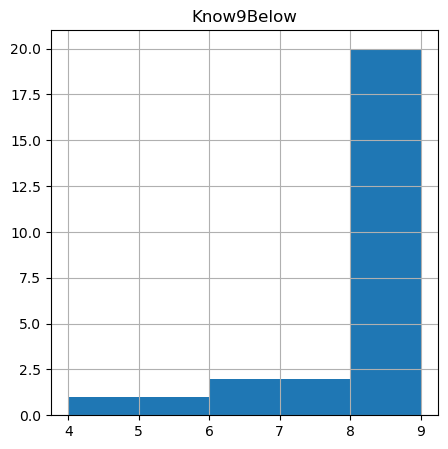

In [342]:
df.hist(column='Know9Below',
       figsize=(5,5),
       bins=5)